# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages, which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission if necessary. 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the iPython Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission. 

In addition to implementing code, there is a writeup to complete. The writeup should be completed in a separate file, which can be either a markdown file or a pdf document. There is a [write up template](https://github.com/udacity/CarND-Traffic-Sign-Classifier-Project/blob/master/writeup_template.md) that can be used to guide the writing process. Completing the code template and writeup template will cover all of the [rubric points](https://review.udacity.com/#!/rubrics/481/view) for this project.

The [rubric](https://review.udacity.com/#!/rubrics/481/view) contains "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. The stand out suggestions are optional. If you decide to pursue the "stand out suggestions", you can include the code in this Ipython notebook and also discuss the results in the writeup file.


>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Step 0: Load The Data

In [1]:
# Load pickled data
import pickle

# Fill this in based on where you saved the training and testing data

training_file = './data/train.p'
validation_file= './data/valid.p'
testing_file = './data/test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(validation_file, mode='rb') as f:
    valid = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_valid, y_valid = valid['features'], valid['labels']
X_test, y_test = test['features'], test['labels']

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 1D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below. Use python, numpy and/or pandas methods to calculate the data summary rather than hard coding the results. For example, the [pandas shape method](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.shape.html) might be useful for calculating some of the summary results. 

### Provide a Basic Summary of the Data Set Using Python, Numpy and/or Pandas

In [2]:
import numpy as np
SEED = 1501
np.random.seed(SEED)
### Replace each question mark with the appropriate value. 
### Use python, pandas or numpy methods rather than hard coding the results

# Number of training examples
n_train = X_train.shape[0]

# Number of validation examples
n_validation = X_valid.shape[0]

# Number of testing examples.
n_test = X_test.shape[0]

# What's the shape of an traffic sign image?
image_shape = X_train.shape[1:]

# How many unique classes/labels there are in the dataset.
n_classes = len(np.unique(y_train))

print("Number of training examples =", n_train)
print("Number of validation examples=", n_validation)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 34799
Number of validation examples= 4410
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


### Include an exploratory visualization of the dataset

Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc. 

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections. It can be interesting to look at the distribution of classes in the training, validation and test set. Is the distribution the same? Are there more examples of some classes than others?

In [3]:
### Data exploration visualization code goes here.
### Feel free to use as many code cells as needed.
import matplotlib.pyplot as plt
# Visualizations will be shown in the notebook.
%matplotlib inline

# Define the show_images function - show images for testing
def show_images(images, cols = 10, cmap=None):
    rows = (len(images)+1)//cols
    fig, axs = plt.subplots(rows,cols, figsize=(18, rows * 2))
    fig.subplots_adjust(hspace = .1, wspace=.001)
    axs = axs.ravel()
    for i, img in enumerate(images):
        axs[i].axis('off')
        if(len(img.shape) == 2):
            cmap = 'gray'
            axs[i].imshow(img.squeeze(), cmap)
        else:
            axs[i].imshow(img, cmap)

# Show the histogram of label frequency            
def show_histogram(y, n_classes):
    # histogram of label frequency
    hist, bins = np.histogram(y, bins=n_classes)
    center = (bins[:-1] + bins[1:]) / 2
    plt.title("Distribution of dataset")
    plt.xlabel("Class number")
    plt.ylabel("No image")
    plt.bar(center, hist)
    plt.show()
        



#### The distribution of training dataset

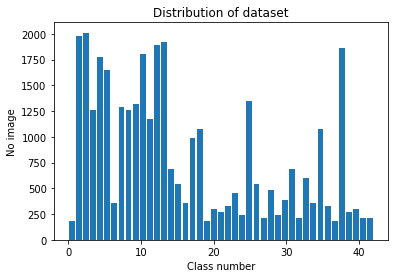

In [4]:
show_histogram(y_train, n_classes)

The training dataset is very unbalanced with some classes have only about 180 images and some classes have over 1500 images.

#### The distribution of validation dataset

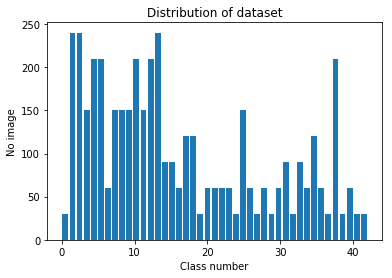

In [5]:
show_histogram(y_valid, n_classes)

The validation dataset distribution is very similar to the training dataset distribution.

#### Show some sample images

In [6]:
import random
from pandas.io.parsers import read_csv

random.seed(SEED)

signnames = read_csv("signnames.csv").values[:, 1]
col_width = max(len(name) for name in signnames)

# Function - Show 10 random sample images for each class
def show_sample_images(labels, images, cmap=None):
    sign_classes, class_indices, class_counts = np.unique(labels, return_index = True, return_counts = True)

    for c, c_index, c_count in zip(sign_classes, class_indices, class_counts):
        print("Class %i: %-*s  %s samples" % (c, col_width, signnames[c], str(c_count)))
        fig = plt.figure(figsize = (18, 3))
        fig.subplots_adjust(left = 0, right = 1, bottom = 0, top = 1, hspace = 0.05, wspace = 0.05)
        random_indices = random.sample(range(c_index, c_index + c_count), 10)
        for i in range(10):
            axis = fig.add_subplot(1, 10, i + 1, xticks=[], yticks=[])
            if cmap == 'gray':
                axis.imshow(images[random_indices[i]].squeeze(), cmap='gray')
            else:
                axis.imshow(images[random_indices[i]])
        plt.show()
        print("--------------------------------------------------------------------------------------\n")
    

##### Sample training images

Class 0: Speed limit (20km/h)                                180 samples


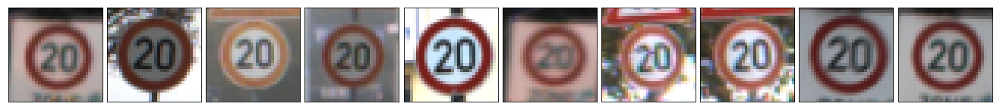

--------------------------------------------------------------------------------------

Class 1: Speed limit (30km/h)                                1980 samples


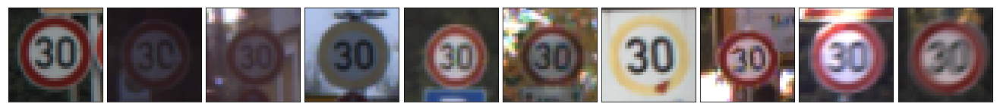

--------------------------------------------------------------------------------------

Class 2: Speed limit (50km/h)                                2010 samples


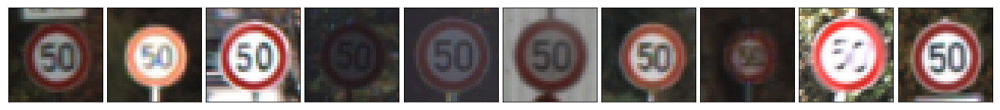

--------------------------------------------------------------------------------------

Class 3: Speed limit (60km/h)                                1260 samples


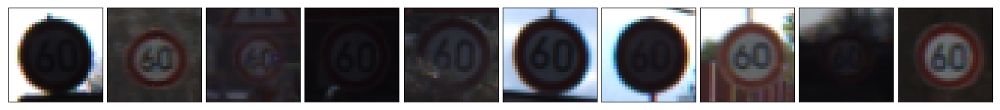

--------------------------------------------------------------------------------------

Class 4: Speed limit (70km/h)                                1770 samples


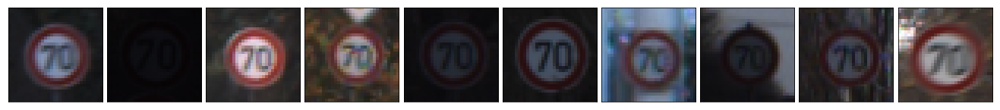

--------------------------------------------------------------------------------------

Class 5: Speed limit (80km/h)                                1650 samples


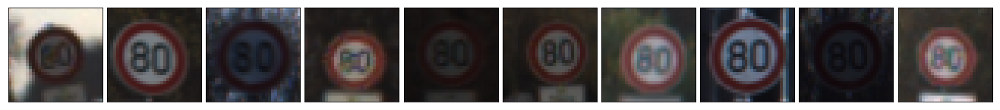

--------------------------------------------------------------------------------------

Class 6: End of speed limit (80km/h)                         360 samples


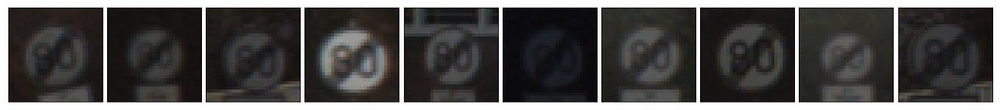

--------------------------------------------------------------------------------------

Class 7: Speed limit (100km/h)                               1290 samples


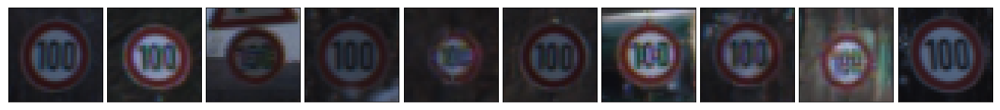

--------------------------------------------------------------------------------------

Class 8: Speed limit (120km/h)                               1260 samples


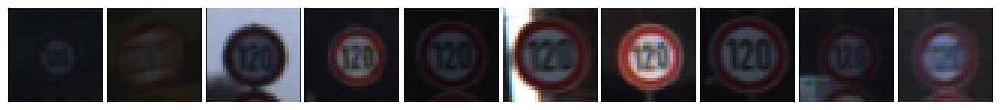

--------------------------------------------------------------------------------------

Class 9: No passing                                          1320 samples


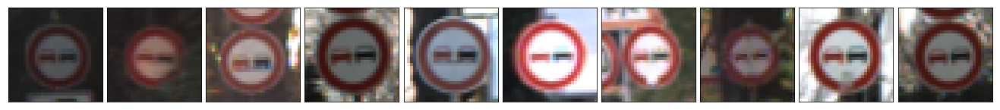

--------------------------------------------------------------------------------------

Class 10: No passing for vehicles over 3.5 metric tons        1800 samples


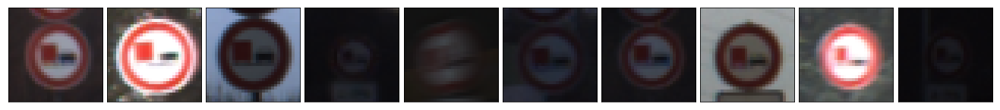

--------------------------------------------------------------------------------------

Class 11: Right-of-way at the next intersection               1170 samples


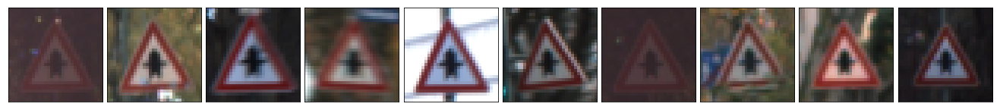

--------------------------------------------------------------------------------------

Class 12: Priority road                                       1890 samples


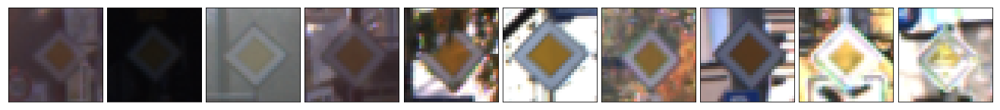

--------------------------------------------------------------------------------------

Class 13: Yield                                               1920 samples


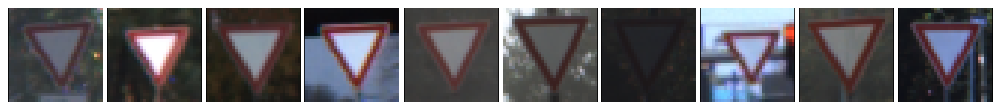

--------------------------------------------------------------------------------------

Class 14: Stop                                                690 samples


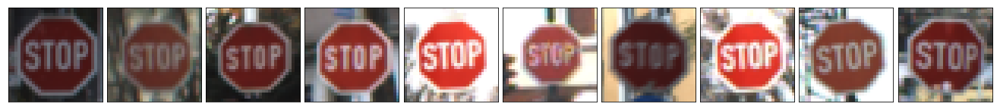

--------------------------------------------------------------------------------------

Class 15: No vehicles                                         540 samples


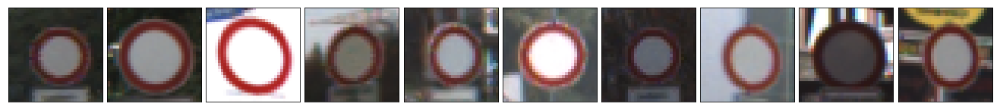

--------------------------------------------------------------------------------------

Class 16: Vehicles over 3.5 metric tons prohibited            360 samples


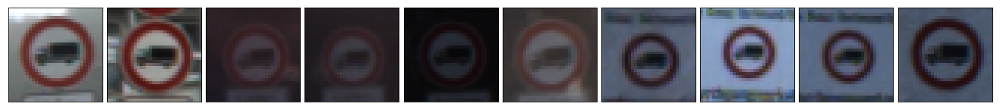

--------------------------------------------------------------------------------------

Class 17: No entry                                            990 samples


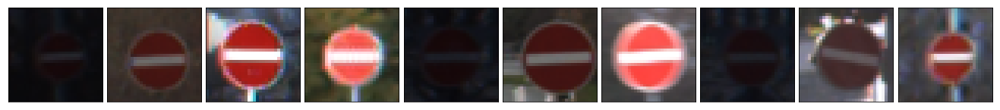

--------------------------------------------------------------------------------------

Class 18: General caution                                     1080 samples


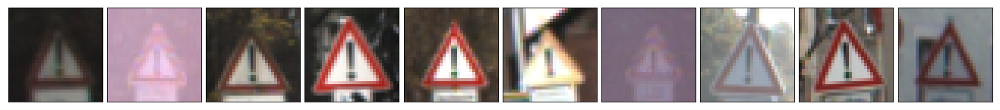

--------------------------------------------------------------------------------------

Class 19: Dangerous curve to the left                         180 samples


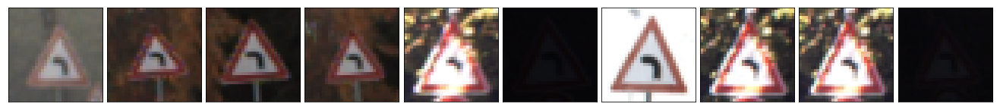

--------------------------------------------------------------------------------------

Class 20: Dangerous curve to the right                        300 samples


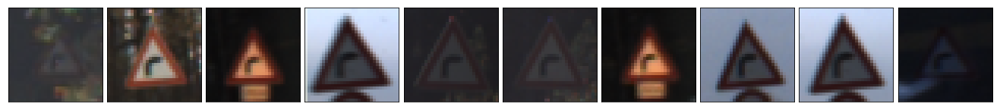

--------------------------------------------------------------------------------------

Class 21: Double curve                                        270 samples


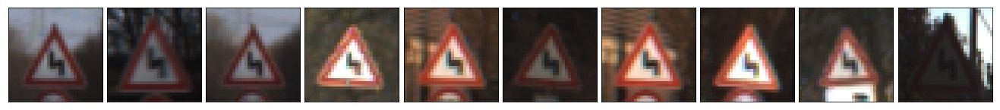

--------------------------------------------------------------------------------------

Class 22: Bumpy road                                          330 samples


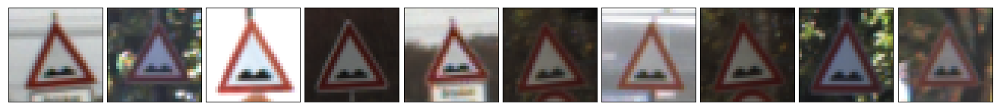

--------------------------------------------------------------------------------------

Class 23: Slippery road                                       450 samples


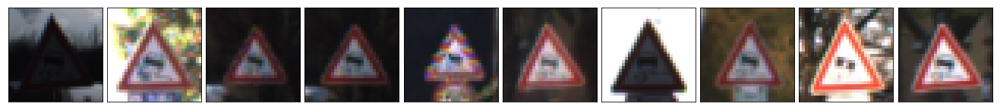

--------------------------------------------------------------------------------------

Class 24: Road narrows on the right                           240 samples


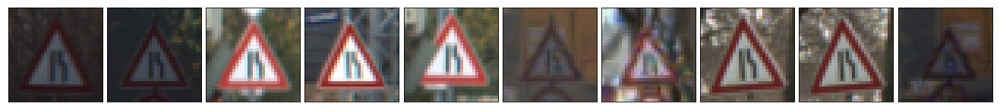

--------------------------------------------------------------------------------------

Class 25: Road work                                           1350 samples


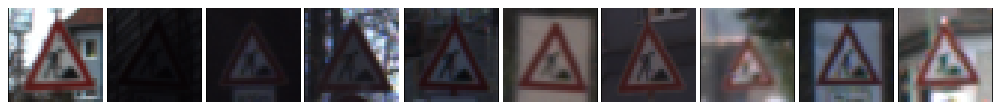

--------------------------------------------------------------------------------------

Class 26: Traffic signals                                     540 samples


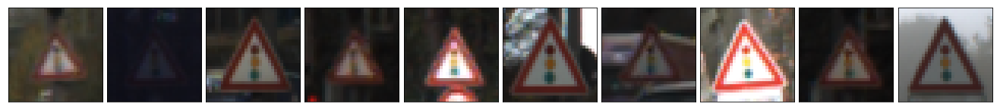

--------------------------------------------------------------------------------------

Class 27: Pedestrians                                         210 samples


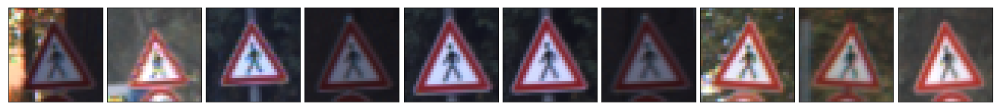

--------------------------------------------------------------------------------------

Class 28: Children crossing                                   480 samples


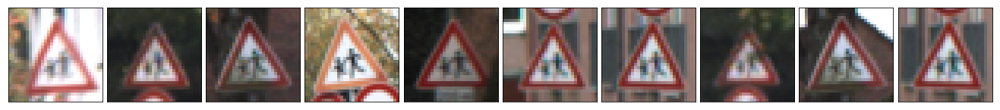

--------------------------------------------------------------------------------------

Class 29: Bicycles crossing                                   240 samples


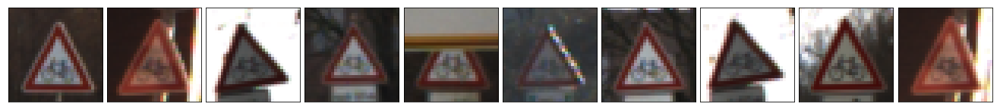

--------------------------------------------------------------------------------------

Class 30: Beware of ice/snow                                  390 samples


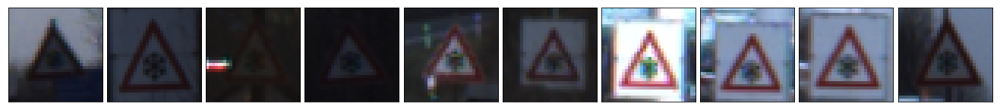

--------------------------------------------------------------------------------------

Class 31: Wild animals crossing                               690 samples


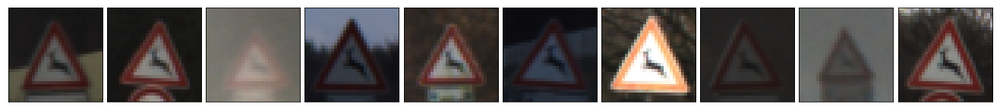

--------------------------------------------------------------------------------------

Class 32: End of all speed and passing limits                 210 samples


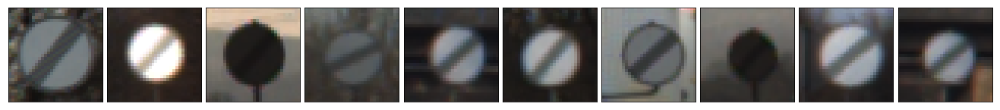

--------------------------------------------------------------------------------------

Class 33: Turn right ahead                                    599 samples


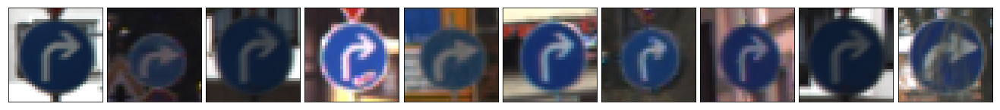

--------------------------------------------------------------------------------------

Class 34: Turn left ahead                                     360 samples


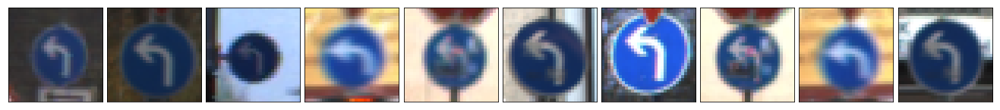

--------------------------------------------------------------------------------------

Class 35: Ahead only                                          1080 samples


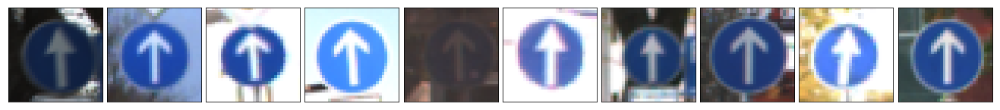

--------------------------------------------------------------------------------------

Class 36: Go straight or right                                330 samples


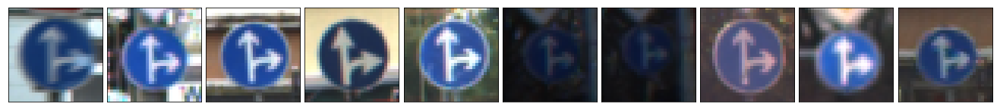

--------------------------------------------------------------------------------------

Class 37: Go straight or left                                 180 samples


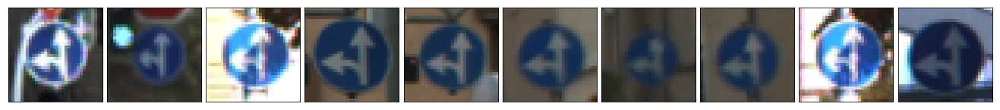

--------------------------------------------------------------------------------------

Class 38: Keep right                                          1860 samples


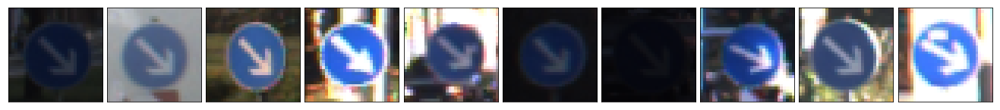

--------------------------------------------------------------------------------------

Class 39: Keep left                                           270 samples


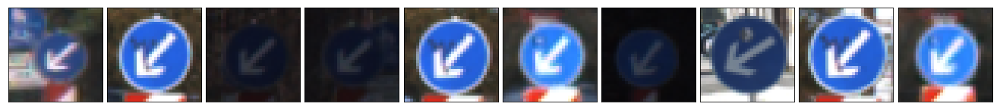

--------------------------------------------------------------------------------------

Class 40: Roundabout mandatory                                300 samples


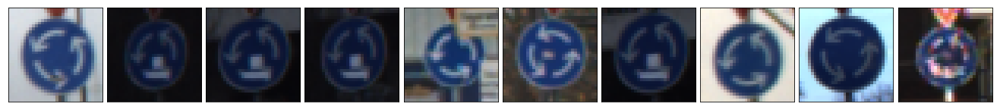

--------------------------------------------------------------------------------------

Class 41: End of no passing                                   210 samples


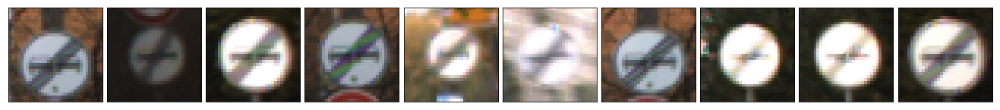

--------------------------------------------------------------------------------------

Class 42: End of no passing by vehicles over 3.5 metric tons  210 samples


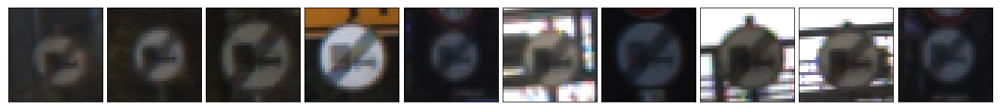

--------------------------------------------------------------------------------------



In [7]:
show_sample_images(y_train, X_train)

The images are significant different in term of contrast and brightness.

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play! 

With the LeNet-5 solution from the lecture, you should expect a validation set accuracy of about 0.89. To meet specifications, the validation set accuracy will need to be at least 0.93. It is possible to get an even higher accuracy, but 0.93 is the minimum for a successful project submission. 

There are various aspects to consider when thinking about this problem:

- Neural network architecture (is the network over or underfitting?)
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

### Pre-process the Data Set (normalization, grayscale, etc.)

Minimally, the image data should be normalized so that the data has mean zero and equal variance. For image data, `(pixel - 128)/ 128` is a quick way to approximately normalize the data and can be used in this project. 

Other pre-processing steps are optional. You can try different techniques to see if it improves performance. 

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project.

#### Convert to grayscale images

According the [Traffic Sign Classification article of Pierre Sermanet and Yann LeCun ](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf), coverting the images to grayscale worked well and it also helps reduce the training time.

In [9]:
# Convert images to grayscale
def grayscale_images(images):
    return np.sum(images/3, axis=3, keepdims=True)

# Convert to grayscale images
X_train_gray = grayscale_images(X_train)
X_valid_gray = grayscale_images(X_valid)

Class 0: Speed limit (20km/h)                                180 samples


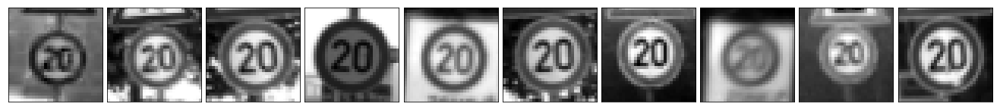

--------------------------------------------------------------------------------------

Class 1: Speed limit (30km/h)                                1980 samples


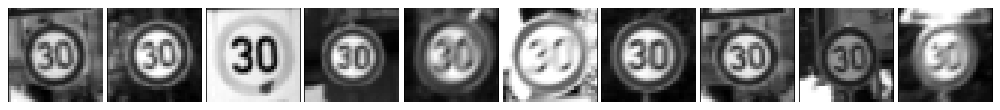

--------------------------------------------------------------------------------------

Class 2: Speed limit (50km/h)                                2010 samples


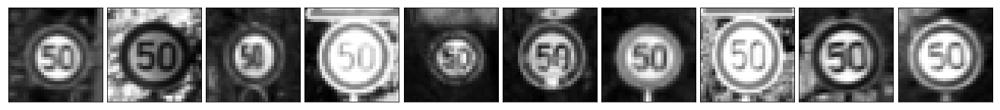

--------------------------------------------------------------------------------------

Class 3: Speed limit (60km/h)                                1260 samples


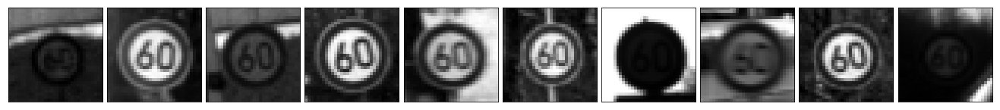

--------------------------------------------------------------------------------------

Class 4: Speed limit (70km/h)                                1770 samples


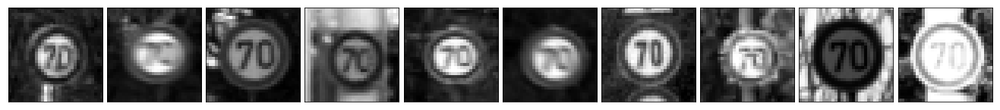

--------------------------------------------------------------------------------------

Class 5: Speed limit (80km/h)                                1650 samples


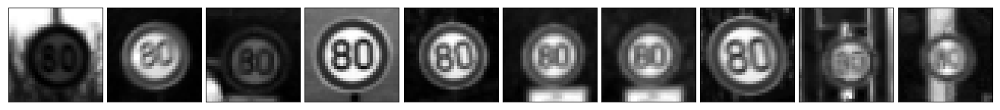

--------------------------------------------------------------------------------------

Class 6: End of speed limit (80km/h)                         360 samples


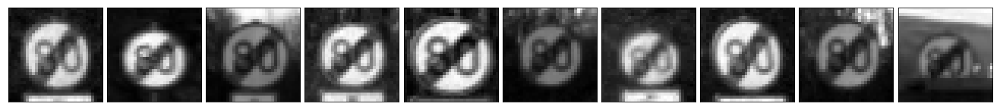

--------------------------------------------------------------------------------------

Class 7: Speed limit (100km/h)                               1290 samples


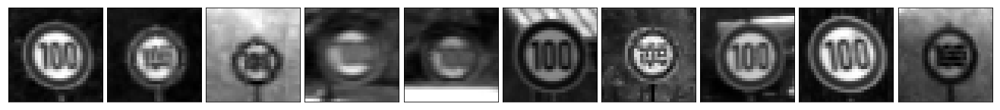

--------------------------------------------------------------------------------------

Class 8: Speed limit (120km/h)                               1260 samples


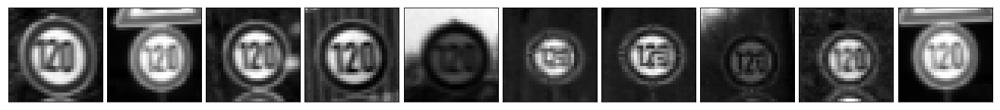

--------------------------------------------------------------------------------------

Class 9: No passing                                          1320 samples


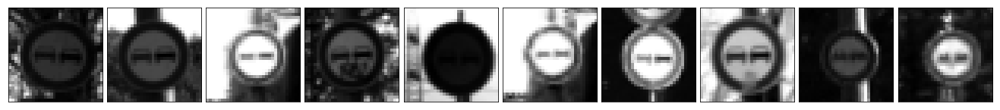

--------------------------------------------------------------------------------------

Class 10: No passing for vehicles over 3.5 metric tons        1800 samples


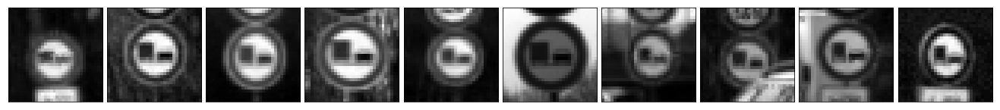

--------------------------------------------------------------------------------------

Class 11: Right-of-way at the next intersection               1170 samples


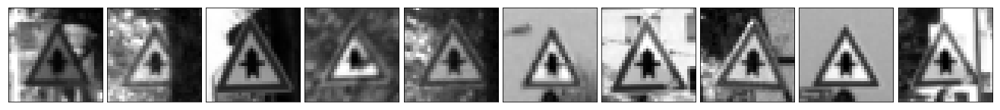

--------------------------------------------------------------------------------------

Class 12: Priority road                                       1890 samples


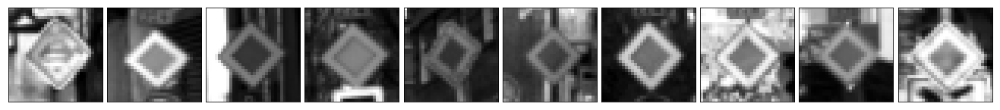

--------------------------------------------------------------------------------------

Class 13: Yield                                               1920 samples


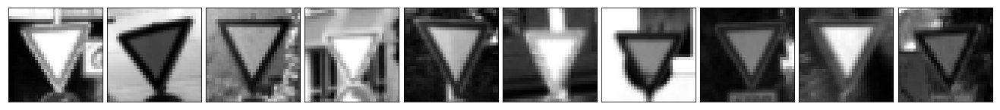

--------------------------------------------------------------------------------------

Class 14: Stop                                                690 samples


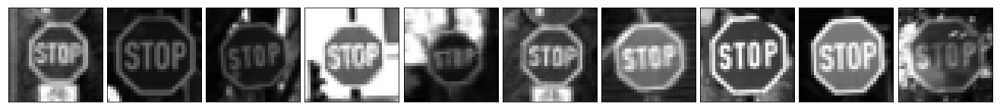

--------------------------------------------------------------------------------------

Class 15: No vehicles                                         540 samples


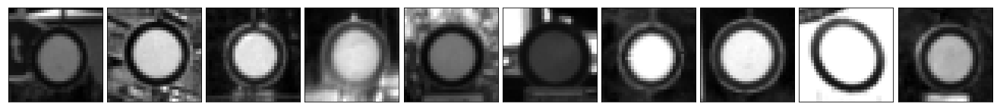

--------------------------------------------------------------------------------------

Class 16: Vehicles over 3.5 metric tons prohibited            360 samples


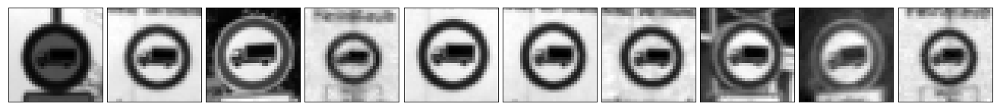

--------------------------------------------------------------------------------------

Class 17: No entry                                            990 samples


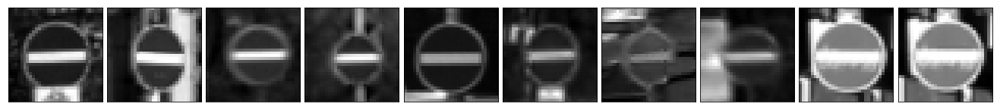

--------------------------------------------------------------------------------------

Class 18: General caution                                     1080 samples


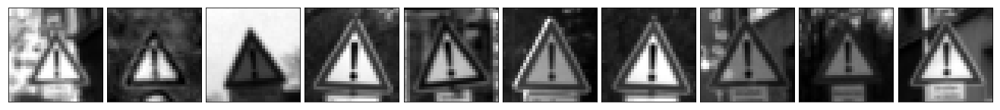

--------------------------------------------------------------------------------------

Class 19: Dangerous curve to the left                         180 samples


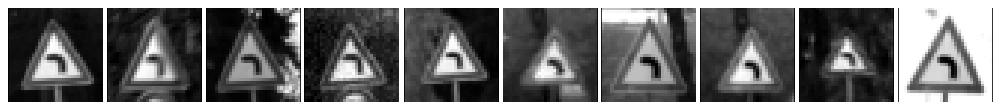

--------------------------------------------------------------------------------------

Class 20: Dangerous curve to the right                        300 samples


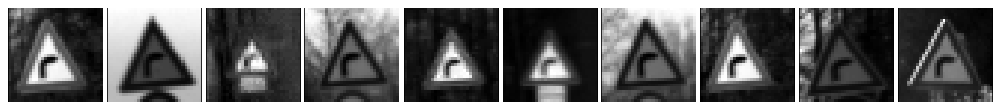

--------------------------------------------------------------------------------------

Class 21: Double curve                                        270 samples


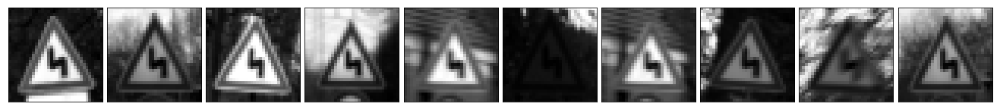

--------------------------------------------------------------------------------------

Class 22: Bumpy road                                          330 samples


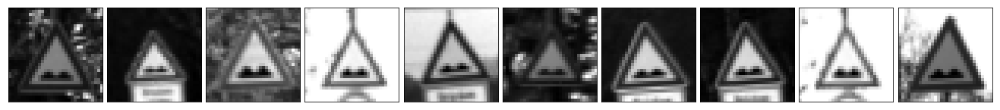

--------------------------------------------------------------------------------------

Class 23: Slippery road                                       450 samples


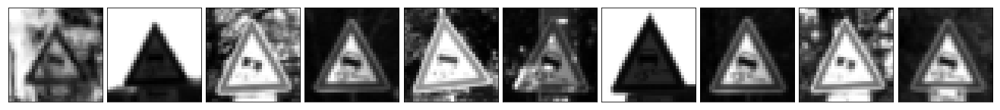

--------------------------------------------------------------------------------------

Class 24: Road narrows on the right                           240 samples


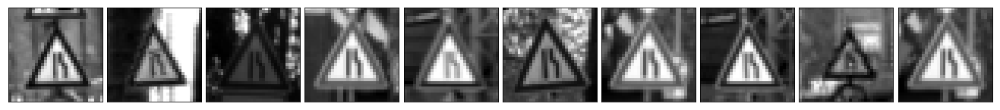

--------------------------------------------------------------------------------------

Class 25: Road work                                           1350 samples


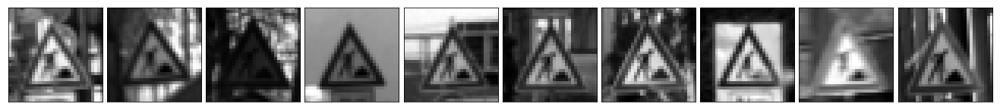

--------------------------------------------------------------------------------------

Class 26: Traffic signals                                     540 samples


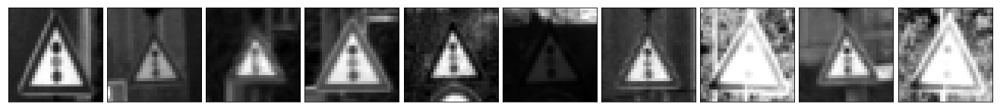

--------------------------------------------------------------------------------------

Class 27: Pedestrians                                         210 samples


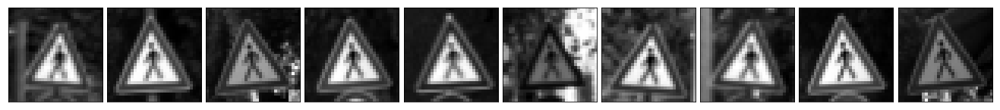

--------------------------------------------------------------------------------------

Class 28: Children crossing                                   480 samples


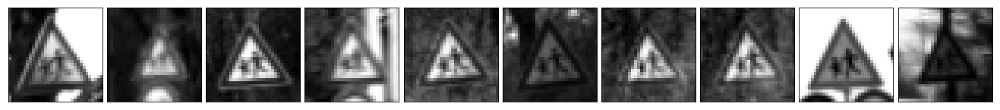

--------------------------------------------------------------------------------------

Class 29: Bicycles crossing                                   240 samples


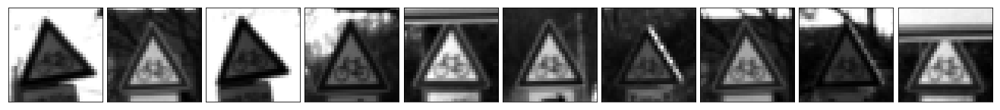

--------------------------------------------------------------------------------------

Class 30: Beware of ice/snow                                  390 samples


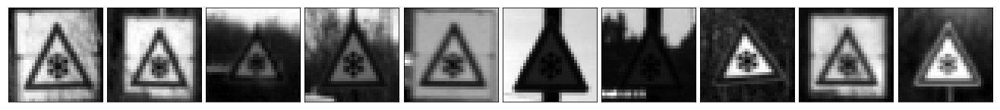

--------------------------------------------------------------------------------------

Class 31: Wild animals crossing                               690 samples


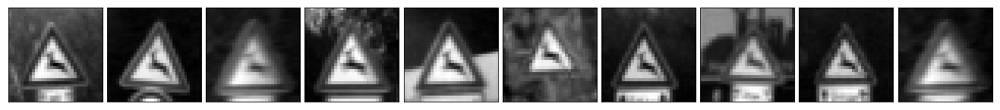

--------------------------------------------------------------------------------------

Class 32: End of all speed and passing limits                 210 samples


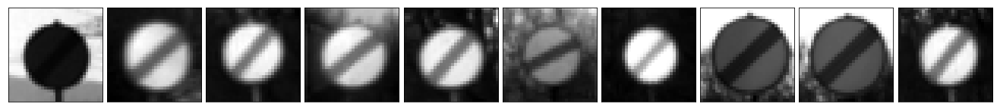

--------------------------------------------------------------------------------------

Class 33: Turn right ahead                                    599 samples


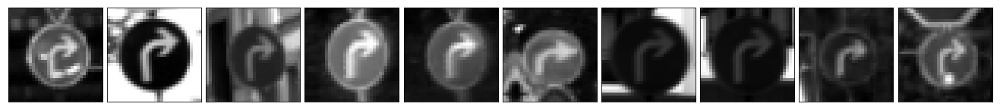

--------------------------------------------------------------------------------------

Class 34: Turn left ahead                                     360 samples


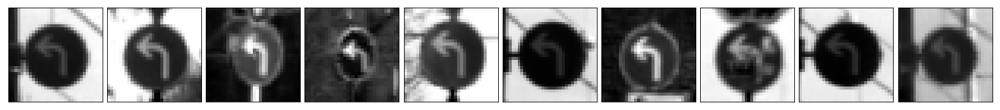

--------------------------------------------------------------------------------------

Class 35: Ahead only                                          1080 samples


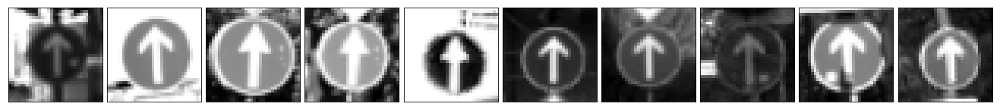

--------------------------------------------------------------------------------------

Class 36: Go straight or right                                330 samples


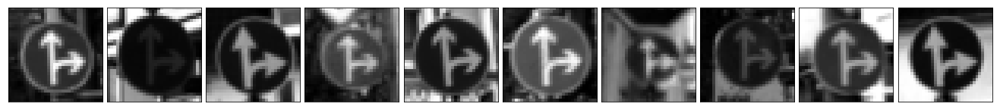

--------------------------------------------------------------------------------------

Class 37: Go straight or left                                 180 samples


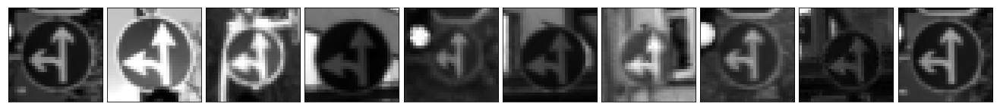

--------------------------------------------------------------------------------------

Class 38: Keep right                                          1860 samples


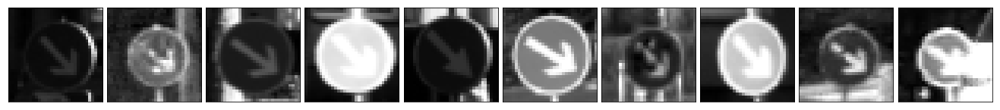

--------------------------------------------------------------------------------------

Class 39: Keep left                                           270 samples


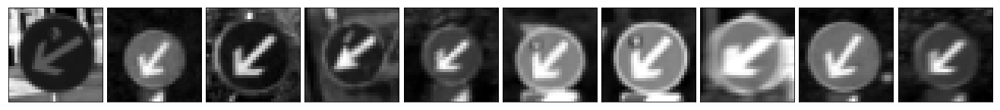

--------------------------------------------------------------------------------------

Class 40: Roundabout mandatory                                300 samples


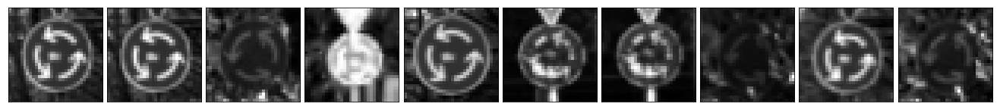

--------------------------------------------------------------------------------------

Class 41: End of no passing                                   210 samples


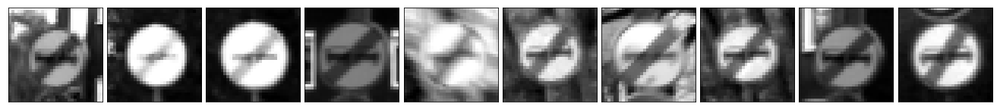

--------------------------------------------------------------------------------------

Class 42: End of no passing by vehicles over 3.5 metric tons  210 samples


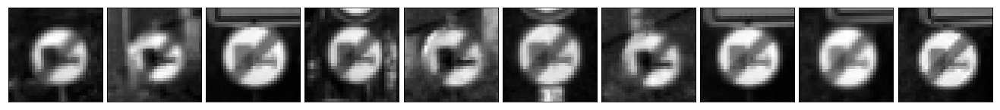

--------------------------------------------------------------------------------------



In [10]:
show_sample_images(y_train, X_train_gray, cmap='gray')

#### Normalize images
Normalizing images helps the traing process for each feature to have a similar range so that out gradient descent don't go out of control. The normalized images don't change the output of the image on traffic sign classifier as some normalized images showing as below.

In [11]:
# Normalized images
def normalized_images(images):
    return (images - 128)/128

# Normalized images
X_train_normalized = normalized_images(X_train_gray)
X_valid_normalized = normalized_images(X_valid_gray)

Class 0: Speed limit (20km/h)                                180 samples


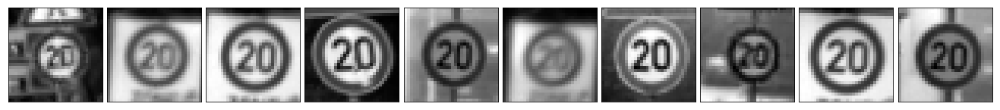

--------------------------------------------------------------------------------------

Class 1: Speed limit (30km/h)                                1980 samples


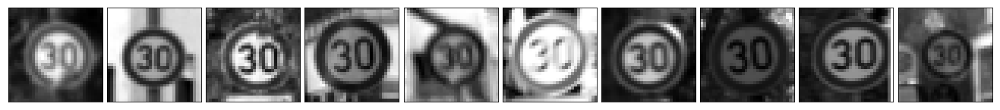

--------------------------------------------------------------------------------------

Class 2: Speed limit (50km/h)                                2010 samples


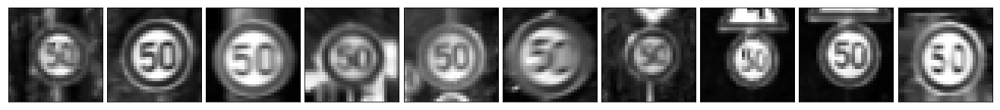

--------------------------------------------------------------------------------------

Class 3: Speed limit (60km/h)                                1260 samples


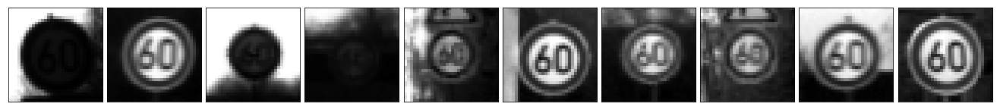

--------------------------------------------------------------------------------------

Class 4: Speed limit (70km/h)                                1770 samples


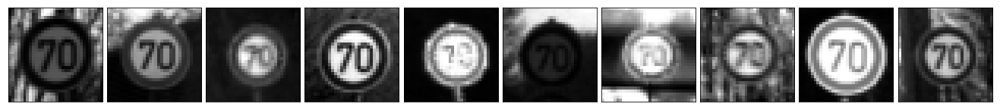

--------------------------------------------------------------------------------------

Class 5: Speed limit (80km/h)                                1650 samples


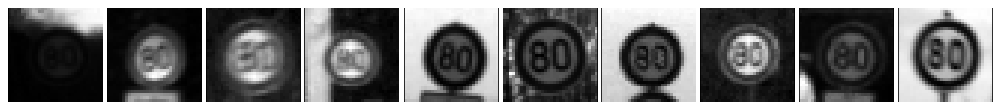

--------------------------------------------------------------------------------------

Class 6: End of speed limit (80km/h)                         360 samples


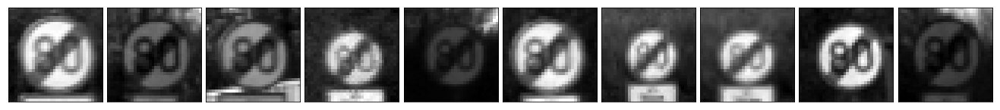

--------------------------------------------------------------------------------------

Class 7: Speed limit (100km/h)                               1290 samples


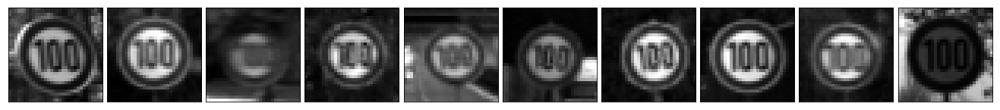

--------------------------------------------------------------------------------------

Class 8: Speed limit (120km/h)                               1260 samples


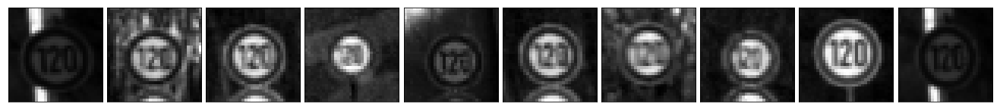

--------------------------------------------------------------------------------------

Class 9: No passing                                          1320 samples


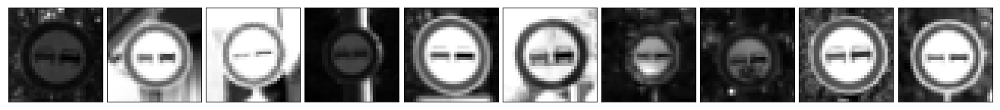

--------------------------------------------------------------------------------------

Class 10: No passing for vehicles over 3.5 metric tons        1800 samples


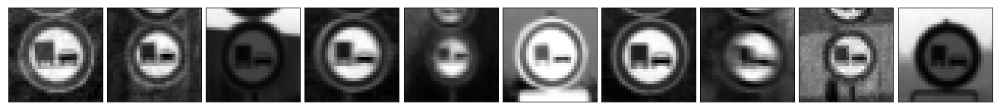

--------------------------------------------------------------------------------------

Class 11: Right-of-way at the next intersection               1170 samples


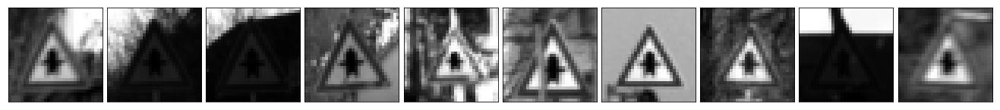

--------------------------------------------------------------------------------------

Class 12: Priority road                                       1890 samples


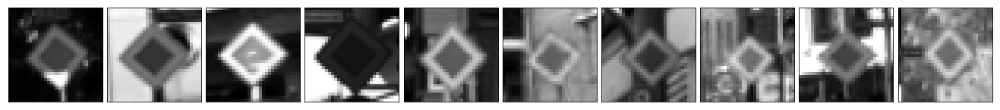

--------------------------------------------------------------------------------------

Class 13: Yield                                               1920 samples


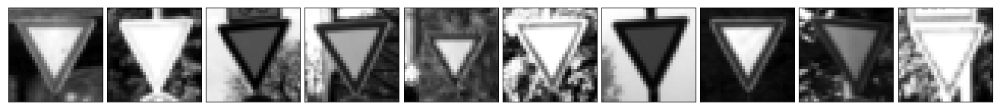

--------------------------------------------------------------------------------------

Class 14: Stop                                                690 samples


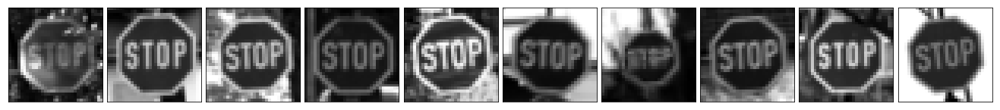

--------------------------------------------------------------------------------------

Class 15: No vehicles                                         540 samples


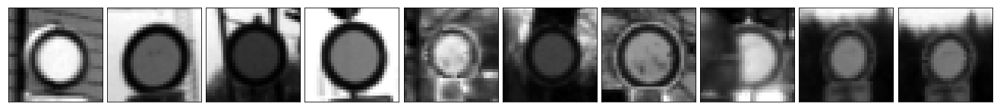

--------------------------------------------------------------------------------------

Class 16: Vehicles over 3.5 metric tons prohibited            360 samples


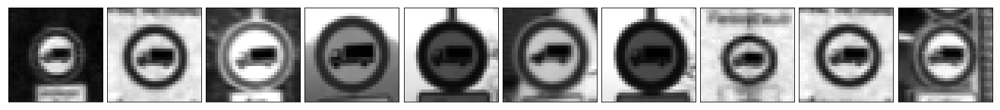

--------------------------------------------------------------------------------------

Class 17: No entry                                            990 samples


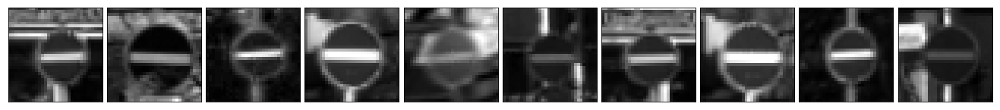

--------------------------------------------------------------------------------------

Class 18: General caution                                     1080 samples


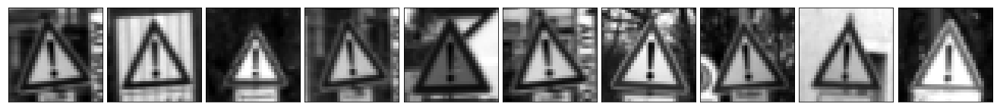

--------------------------------------------------------------------------------------

Class 19: Dangerous curve to the left                         180 samples


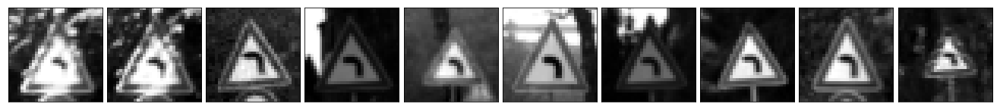

--------------------------------------------------------------------------------------

Class 20: Dangerous curve to the right                        300 samples


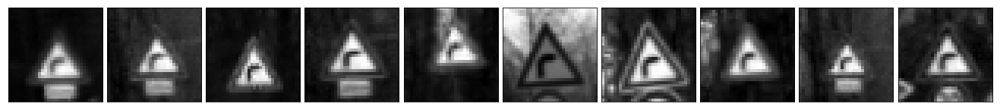

--------------------------------------------------------------------------------------

Class 21: Double curve                                        270 samples


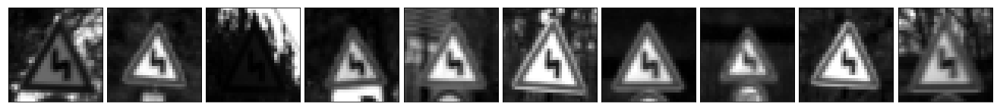

--------------------------------------------------------------------------------------

Class 22: Bumpy road                                          330 samples


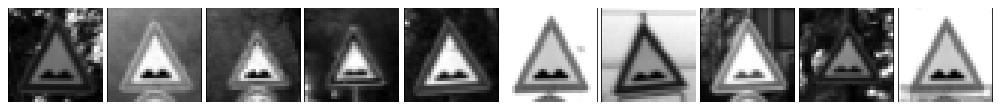

--------------------------------------------------------------------------------------

Class 23: Slippery road                                       450 samples


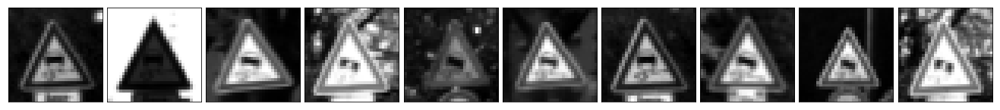

--------------------------------------------------------------------------------------

Class 24: Road narrows on the right                           240 samples


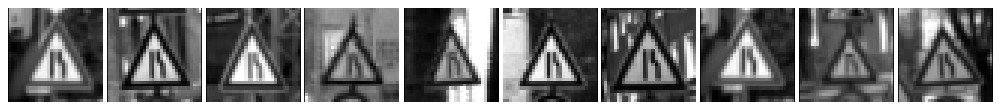

--------------------------------------------------------------------------------------

Class 25: Road work                                           1350 samples


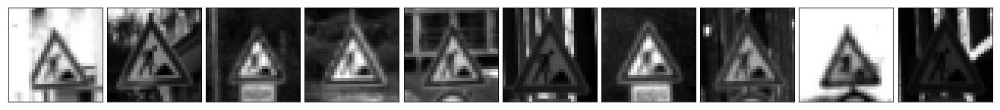

--------------------------------------------------------------------------------------

Class 26: Traffic signals                                     540 samples


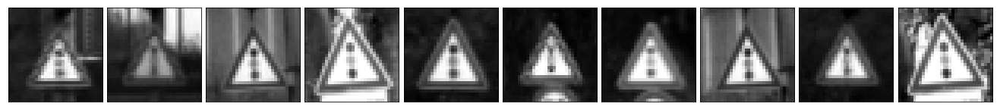

--------------------------------------------------------------------------------------

Class 27: Pedestrians                                         210 samples


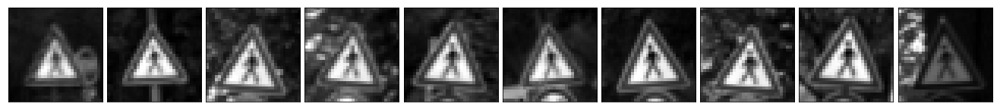

--------------------------------------------------------------------------------------

Class 28: Children crossing                                   480 samples


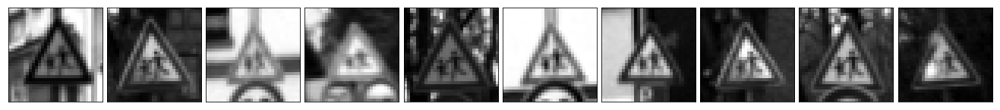

--------------------------------------------------------------------------------------

Class 29: Bicycles crossing                                   240 samples


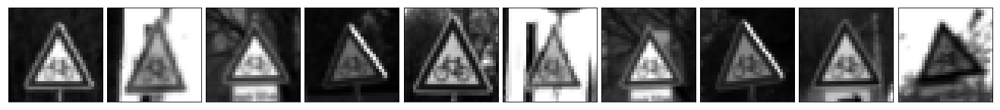

--------------------------------------------------------------------------------------

Class 30: Beware of ice/snow                                  390 samples


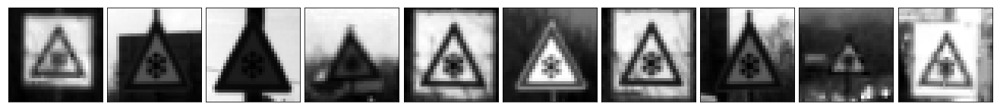

--------------------------------------------------------------------------------------

Class 31: Wild animals crossing                               690 samples


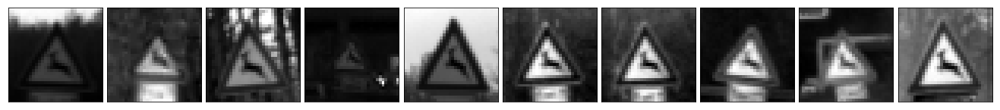

--------------------------------------------------------------------------------------

Class 32: End of all speed and passing limits                 210 samples


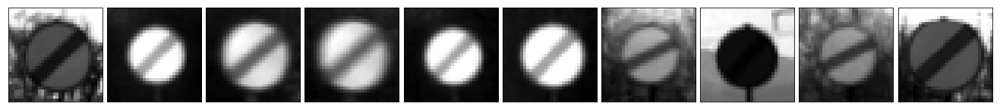

--------------------------------------------------------------------------------------

Class 33: Turn right ahead                                    599 samples


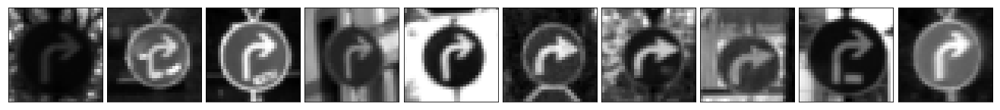

--------------------------------------------------------------------------------------

Class 34: Turn left ahead                                     360 samples


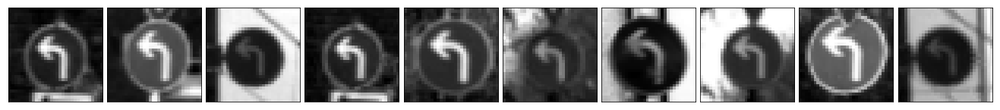

--------------------------------------------------------------------------------------

Class 35: Ahead only                                          1080 samples


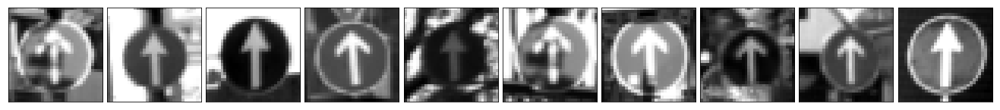

--------------------------------------------------------------------------------------

Class 36: Go straight or right                                330 samples


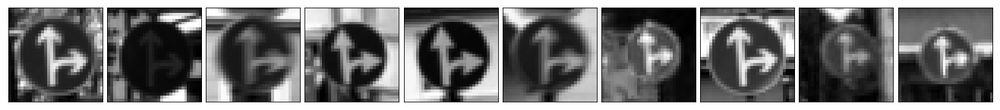

--------------------------------------------------------------------------------------

Class 37: Go straight or left                                 180 samples


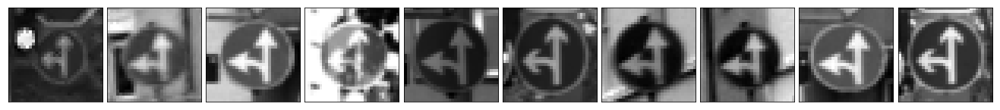

--------------------------------------------------------------------------------------

Class 38: Keep right                                          1860 samples


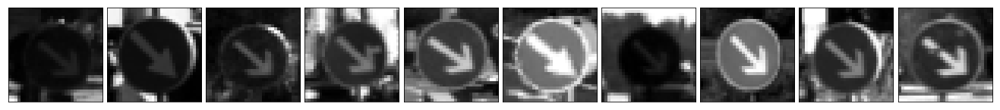

--------------------------------------------------------------------------------------

Class 39: Keep left                                           270 samples


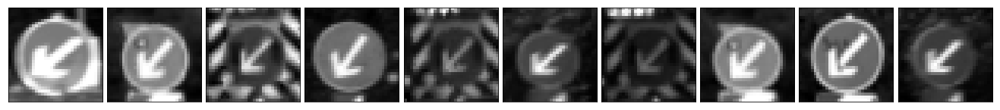

--------------------------------------------------------------------------------------

Class 40: Roundabout mandatory                                300 samples


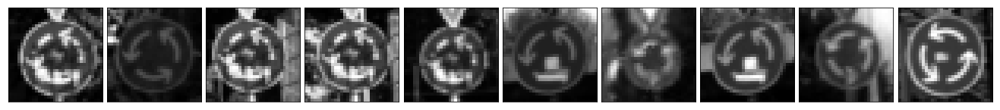

--------------------------------------------------------------------------------------

Class 41: End of no passing                                   210 samples


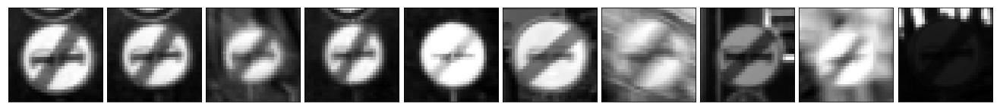

--------------------------------------------------------------------------------------

Class 42: End of no passing by vehicles over 3.5 metric tons  210 samples


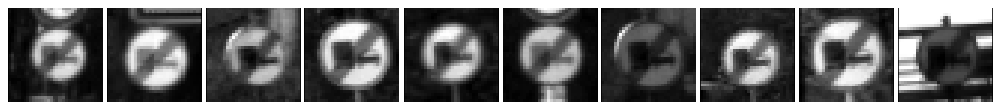

--------------------------------------------------------------------------------------



In [12]:
show_sample_images(y_train, X_train_normalized, cmap='gray')

Class 0: Speed limit (20km/h)                                30 samples


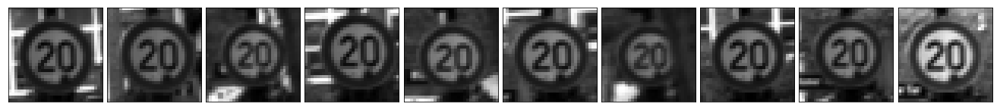

--------------------------------------------------------------------------------------

Class 1: Speed limit (30km/h)                                240 samples


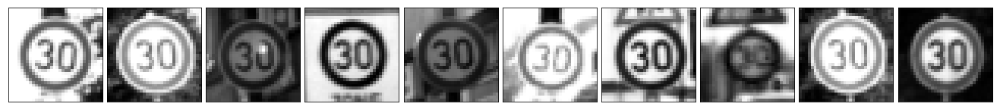

--------------------------------------------------------------------------------------

Class 2: Speed limit (50km/h)                                240 samples


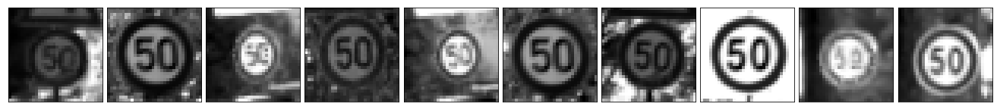

--------------------------------------------------------------------------------------

Class 3: Speed limit (60km/h)                                150 samples


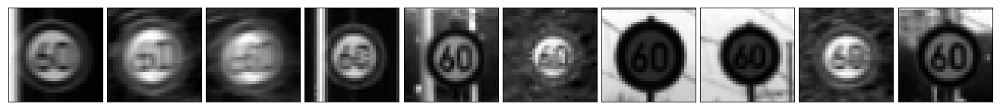

--------------------------------------------------------------------------------------

Class 4: Speed limit (70km/h)                                210 samples


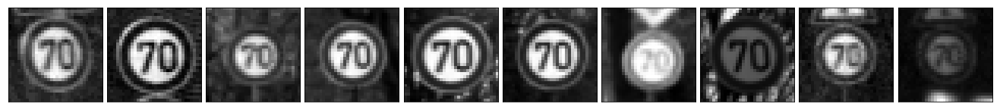

--------------------------------------------------------------------------------------

Class 5: Speed limit (80km/h)                                210 samples


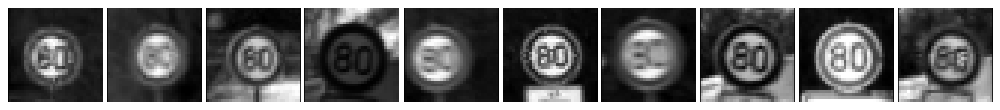

--------------------------------------------------------------------------------------

Class 6: End of speed limit (80km/h)                         60 samples


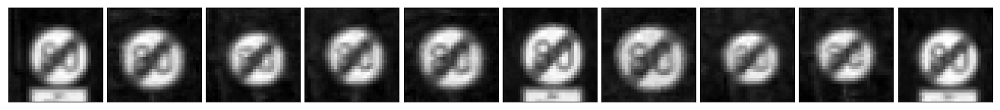

--------------------------------------------------------------------------------------

Class 7: Speed limit (100km/h)                               150 samples


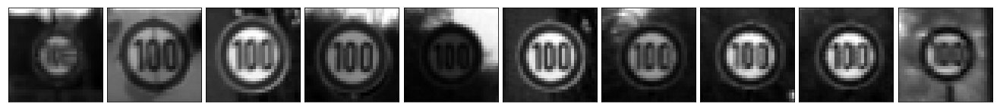

--------------------------------------------------------------------------------------

Class 8: Speed limit (120km/h)                               150 samples


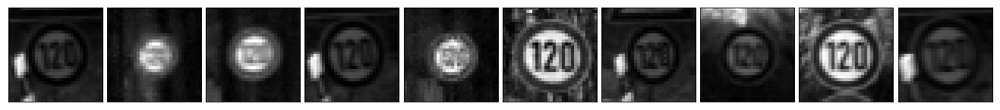

--------------------------------------------------------------------------------------

Class 9: No passing                                          150 samples


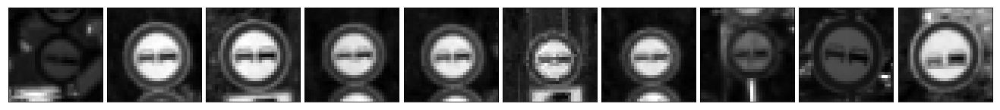

--------------------------------------------------------------------------------------

Class 10: No passing for vehicles over 3.5 metric tons        210 samples


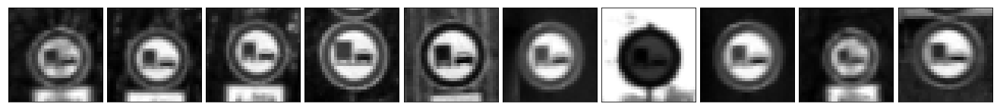

--------------------------------------------------------------------------------------

Class 11: Right-of-way at the next intersection               150 samples


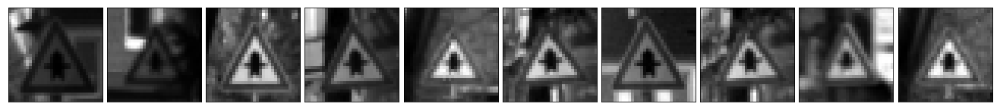

--------------------------------------------------------------------------------------

Class 12: Priority road                                       210 samples


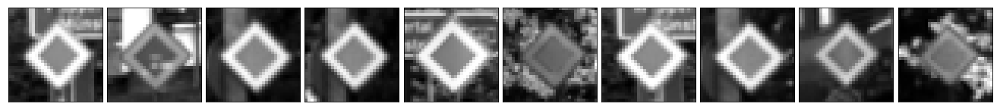

--------------------------------------------------------------------------------------

Class 13: Yield                                               240 samples


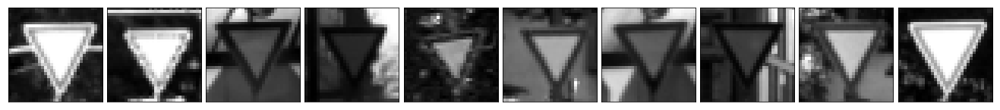

--------------------------------------------------------------------------------------

Class 14: Stop                                                90 samples


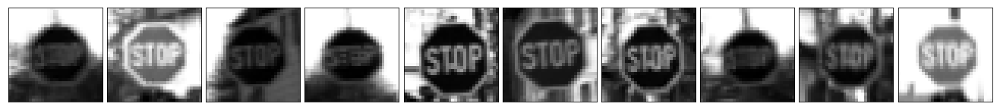

--------------------------------------------------------------------------------------

Class 15: No vehicles                                         90 samples


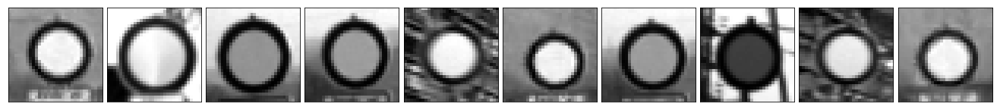

--------------------------------------------------------------------------------------

Class 16: Vehicles over 3.5 metric tons prohibited            60 samples


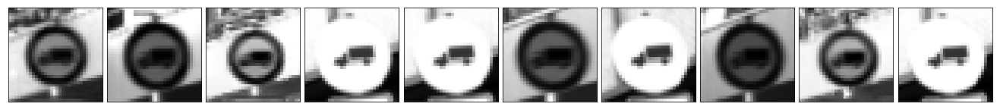

--------------------------------------------------------------------------------------

Class 17: No entry                                            120 samples


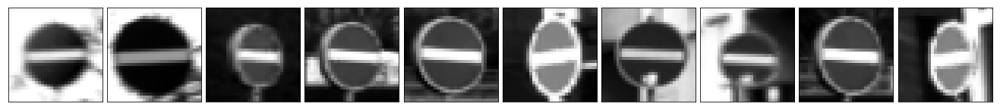

--------------------------------------------------------------------------------------

Class 18: General caution                                     120 samples


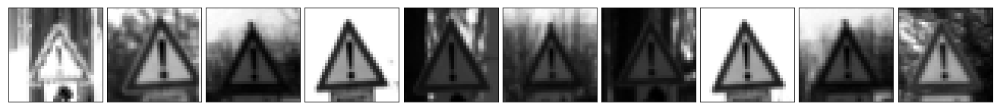

--------------------------------------------------------------------------------------

Class 19: Dangerous curve to the left                         30 samples


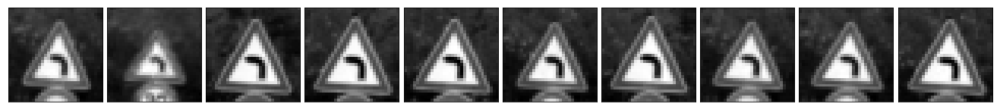

--------------------------------------------------------------------------------------

Class 20: Dangerous curve to the right                        60 samples


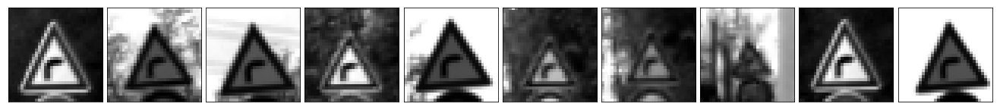

--------------------------------------------------------------------------------------

Class 21: Double curve                                        60 samples


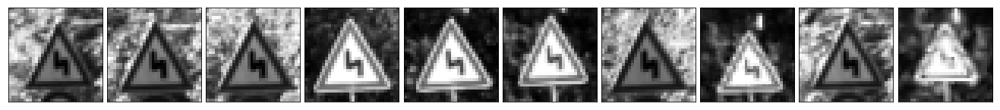

--------------------------------------------------------------------------------------

Class 22: Bumpy road                                          60 samples


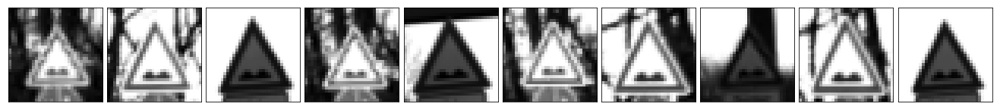

--------------------------------------------------------------------------------------

Class 23: Slippery road                                       60 samples


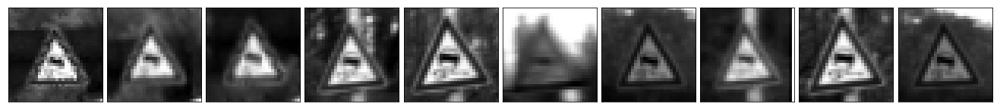

--------------------------------------------------------------------------------------

Class 24: Road narrows on the right                           30 samples


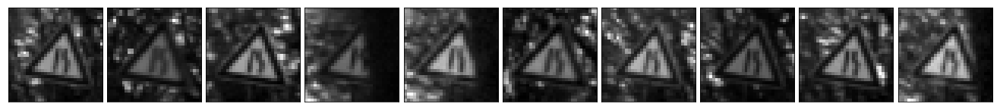

--------------------------------------------------------------------------------------

Class 25: Road work                                           150 samples


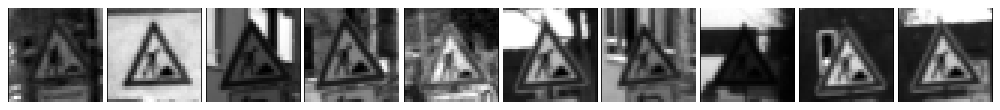

--------------------------------------------------------------------------------------

Class 26: Traffic signals                                     60 samples


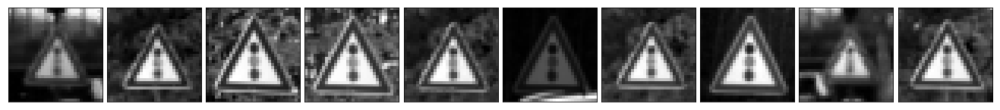

--------------------------------------------------------------------------------------

Class 27: Pedestrians                                         30 samples


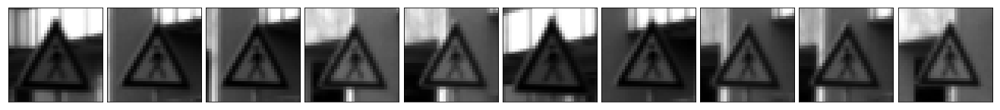

--------------------------------------------------------------------------------------

Class 28: Children crossing                                   60 samples


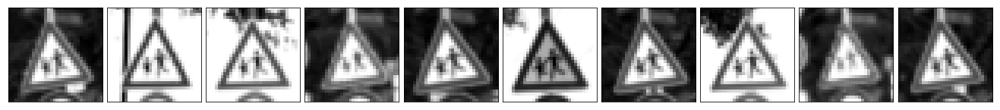

--------------------------------------------------------------------------------------

Class 29: Bicycles crossing                                   30 samples


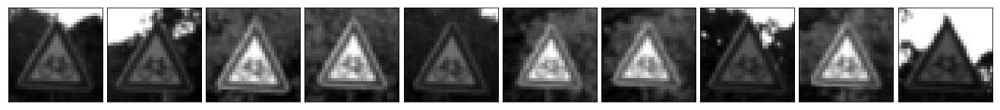

--------------------------------------------------------------------------------------

Class 30: Beware of ice/snow                                  60 samples


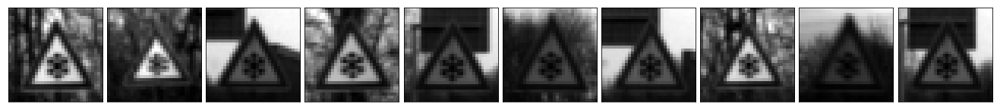

--------------------------------------------------------------------------------------

Class 31: Wild animals crossing                               90 samples


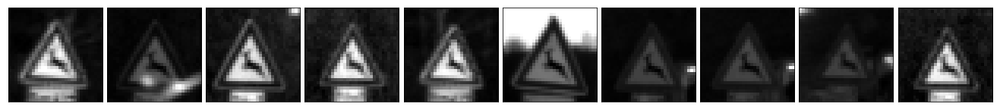

--------------------------------------------------------------------------------------

Class 32: End of all speed and passing limits                 30 samples


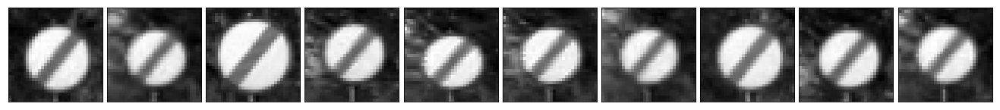

--------------------------------------------------------------------------------------

Class 33: Turn right ahead                                    90 samples


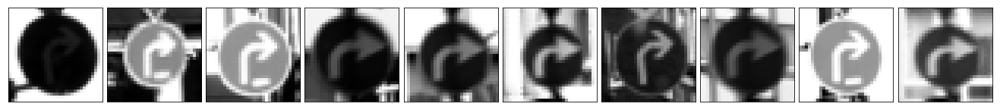

--------------------------------------------------------------------------------------

Class 34: Turn left ahead                                     60 samples


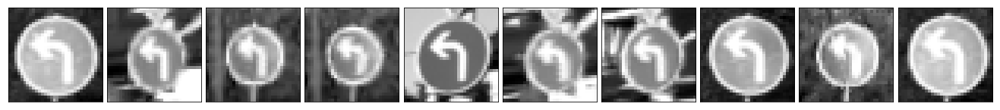

--------------------------------------------------------------------------------------

Class 35: Ahead only                                          120 samples


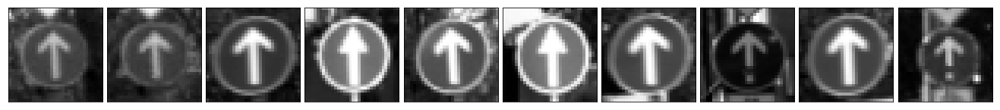

--------------------------------------------------------------------------------------

Class 36: Go straight or right                                60 samples


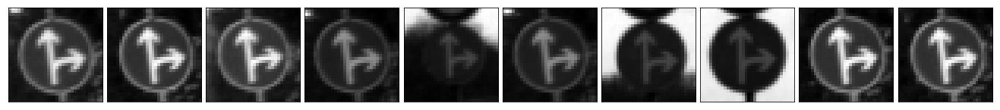

--------------------------------------------------------------------------------------

Class 37: Go straight or left                                 30 samples


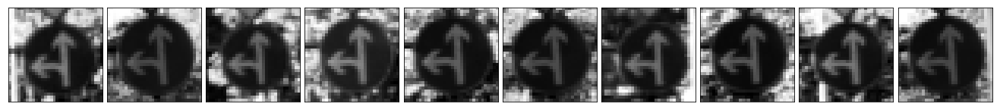

--------------------------------------------------------------------------------------

Class 38: Keep right                                          210 samples


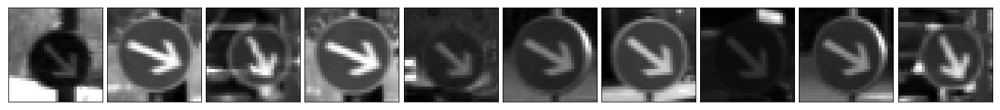

--------------------------------------------------------------------------------------

Class 39: Keep left                                           30 samples


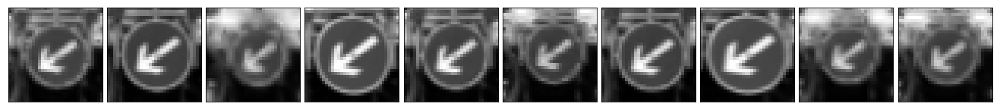

--------------------------------------------------------------------------------------

Class 40: Roundabout mandatory                                60 samples


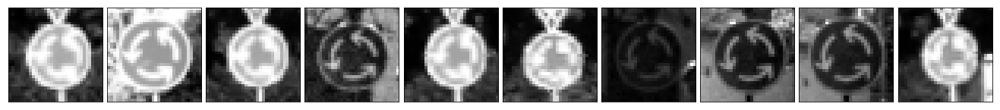

--------------------------------------------------------------------------------------

Class 41: End of no passing                                   30 samples


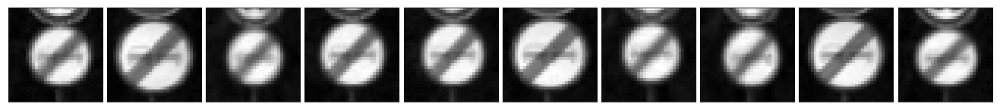

--------------------------------------------------------------------------------------

Class 42: End of no passing by vehicles over 3.5 metric tons  30 samples


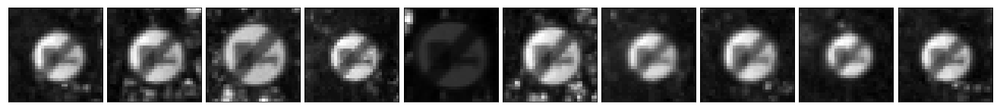

--------------------------------------------------------------------------------------



In [13]:
show_sample_images(y_valid, X_valid_normalized, cmap='gray')

#### Augment the data

##### Translate image
Translating image with a small pixels (3 pixels) in x,y directions doesn't change the meaning of image.

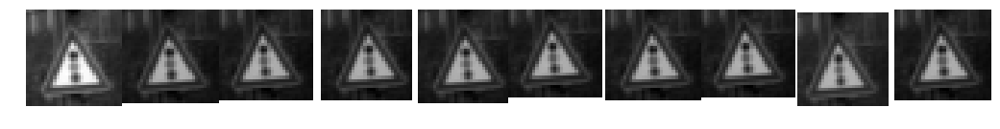

In [14]:
import cv2

# Translate a random up to about 3 pixels in x, y directions
def translate_image(img, px = 3):
    rows,cols,_ = img.shape
    dx,dy = np.random.randint(-px,px,2)

    M = np.float32([[1,0,dx],[0,1,dy]])
    dst = cv2.warpAffine(img,M,(cols,rows))
    dst = dst[:,:,np.newaxis]
    
    return dst

# Utility function use to show 2 images original and converted - use for debugging
def show2images(original, converted, original_title = 'Original', converted_title = 'Converted'):
    fig, axs = plt.subplots(1,2, figsize=(10, 3))
    axs[0].axis('off')
    axs[0].imshow(test_img.squeeze(), cmap='gray')
    axs[0].set_title(original_title)

    axs[1].axis('off')
    axs[1].imshow(test_dst.squeeze(), cmap='gray')
    axs[1].set_title(converted_title)
    
# Define the show_images function - show images for testing
def show_images(images, cols = 10, cmap='gray'):
    rows = (len(images)+1)//cols
    fig, axs = plt.subplots(rows,cols, figsize=(18, rows * 2))
    fig.subplots_adjust(hspace = .1, wspace=.001)
    axs = axs.ravel()
    for i, img in enumerate(images):
        axs[i].axis('off')
        if cmap == 'gray':
            axs[i].imshow(img.squeeze(), cmap)
        else:
            axs[i].imshow(img, cmap)

test_img = X_train_normalized[1523]
test_dsts = []
test_dsts.append(test_img)
for i in range(9):
    test_dsts.append(translate_image(test_img))

show_images(test_dsts, cols = 10, cmap='gray')


##### Scale image
Scaling image randomly from -2 to 2 doesn't change the meaning of traffic sign output.

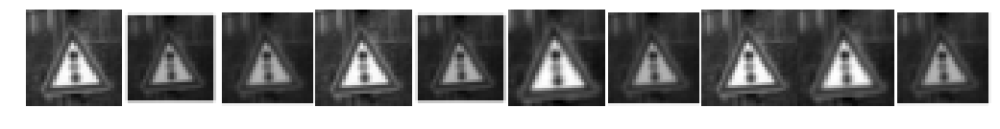

In [15]:
# Scale image randomly from -2 to 2
def scale_image(img, lower_limit=-2, upper_limit=2):   
    rows,cols,_ = img.shape
    # transform limits
    px = np.random.randint(lower_limit,upper_limit)

    # ending locations
    pts1 = np.float32([[px,px],[rows-px,px],[px,cols-px],[rows-px,cols-px]])

    # starting locations (4 corners)
    pts2 = np.float32([[0,0],[rows,0],[0,cols],[rows,cols]])

    M = cv2.getPerspectiveTransform(pts1,pts2)

    dst = cv2.warpPerspective(img,M,(rows,cols))
    
    dst = dst[:,:,np.newaxis]
    
    return dst

test_scale = []
test_scale.append(test_img)
for i in range(9):
    test_scale.append(scale_image(test_img, -3, 3))

show_images(test_scale)

##### Warp image
The traffic signs can be viewed from different viewpoints without changing the meaning, so we can warp traffic signs images in order to increate the dataset.

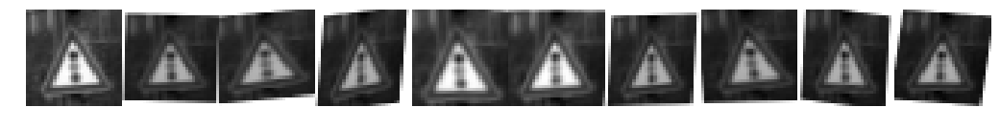

In [16]:
def warp_image(img):
    
    rows,cols,_ = img.shape

    # random scaling coefficients
    rndx = np.random.rand(3) - 0.5
    rndx *= cols * 0.09   # this coefficient determines the degree of warping
    rndy = np.random.rand(3) - 0.5
    rndy *= rows * 0.09

    # 3 starting points for transform, 1/4 way from edges
    x1 = cols/4
    x2 = 3*cols/4
    y1 = rows/4
    y2 = 3*rows/4

    pts1 = np.float32([[y1,x1],
                       [y2,x1],
                       [y1,x2]])
    pts2 = np.float32([[y1+rndy[0],x1+rndx[0]],
                       [y2+rndy[1],x1+rndx[1]],
                       [y1+rndy[2],x2+rndx[2]]])

    M = cv2.getAffineTransform(pts1,pts2)

    dst = cv2.warpAffine(img,M,(cols,rows))
    
    dst = dst[:,:,np.newaxis]
    
    return dst

test_warp = []
test_warp.append(test_img)
for i in range(9):
    test_warp.append(warp_image(test_img))
    
show_images(test_warp)

##### Brightness image
Random changing the brightness with small number can increate the dataset size and the variance of data.

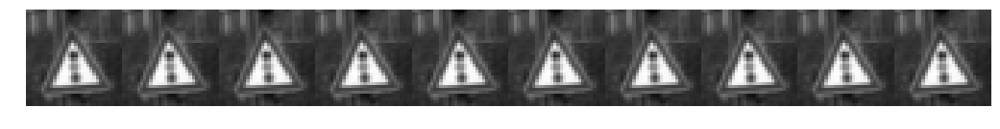

In [17]:
def brightness_image(img, limit = 1.0):
    shifted = img + limit  
    img_max_value = max(shifted.flatten())
    max_coef = 2.0/img_max_value
    min_coef = max_coef - 0.1
    coef = np.random.uniform(min_coef, max_coef)
    dst = shifted * coef - limit
    return dst

test_brightness = []
test_brightness.append(test_img)

for i in range(9):
    test_brightness.append(brightness_image(test_img))
    
show_images(test_brightness)


##### Putting it together - augment image
The translate, scale, warp and brightness image functions work fine. Now, it's time to put everything together in order to implement the augment image function. The show images testing function shows the augmented images are good and don't change the meaning of the original image.

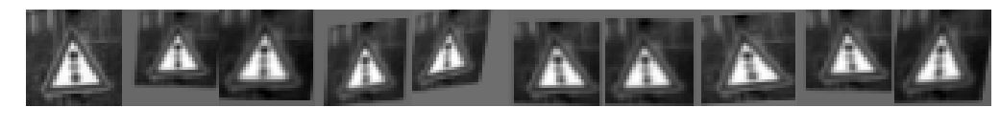

In [18]:
def augment_image(img):
    return translate_image(scale_image(warp_image(brightness_image(img))))

test_augs = []
test_augs.append(test_img)
for i in range(9):
    test_augs.append(augment_image(test_img))

show_images(test_augs)


I have tested the augment image function by randomly one image per class. The result shows that the augmented are some different from the original image and not change the meaning of traffic sign of the original image.

Class 0: Speed limit (20km/h)                              


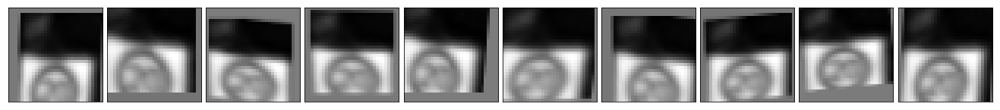

--------------------------------------------------------------------------------------

Class 1: Speed limit (30km/h)                              


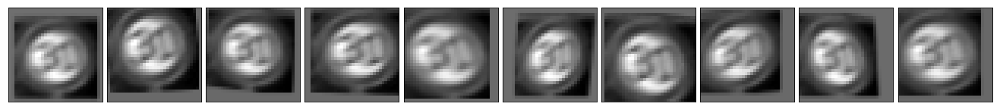

--------------------------------------------------------------------------------------

Class 2: Speed limit (50km/h)                              


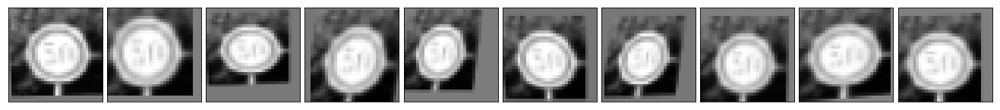

--------------------------------------------------------------------------------------

Class 3: Speed limit (60km/h)                              


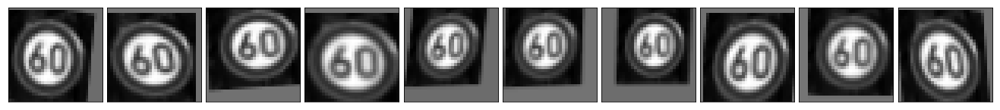

--------------------------------------------------------------------------------------

Class 4: Speed limit (70km/h)                              


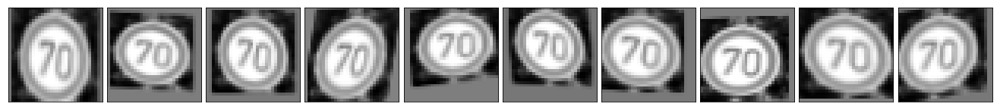

--------------------------------------------------------------------------------------

Class 5: Speed limit (80km/h)                              


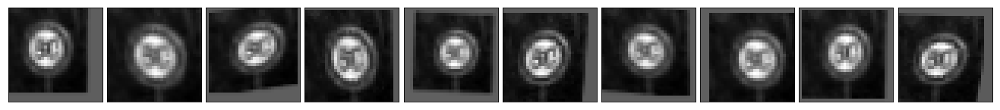

--------------------------------------------------------------------------------------

Class 6: End of speed limit (80km/h)                       


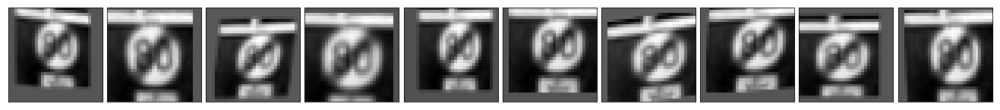

--------------------------------------------------------------------------------------

Class 7: Speed limit (100km/h)                             


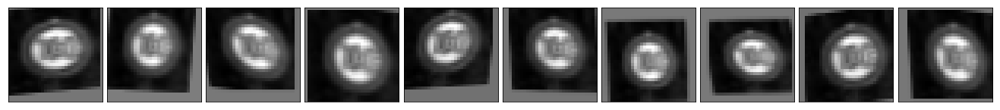

--------------------------------------------------------------------------------------

Class 8: Speed limit (120km/h)                             


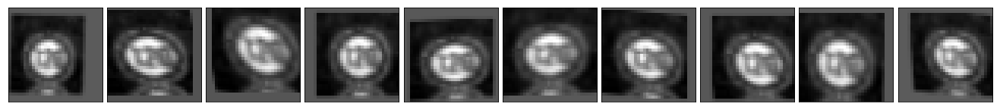

--------------------------------------------------------------------------------------

Class 9: No passing                                        


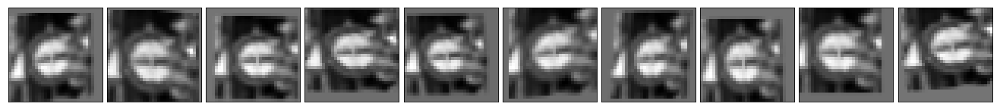

--------------------------------------------------------------------------------------

Class 10: No passing for vehicles over 3.5 metric tons      


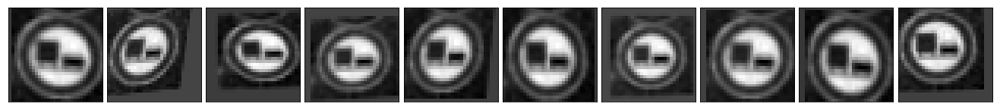

--------------------------------------------------------------------------------------

Class 11: Right-of-way at the next intersection             


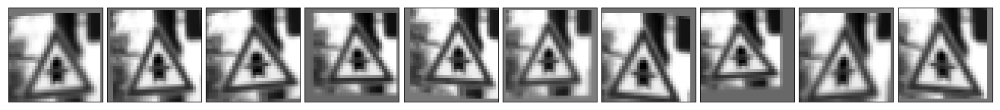

--------------------------------------------------------------------------------------

Class 12: Priority road                                     


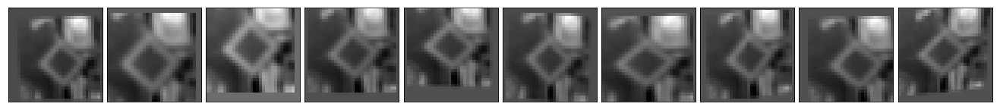

--------------------------------------------------------------------------------------

Class 13: Yield                                             


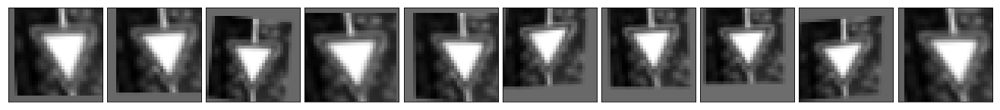

--------------------------------------------------------------------------------------

Class 14: Stop                                              


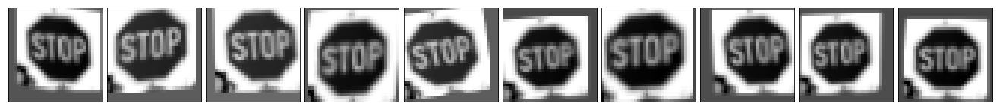

--------------------------------------------------------------------------------------

Class 15: No vehicles                                       


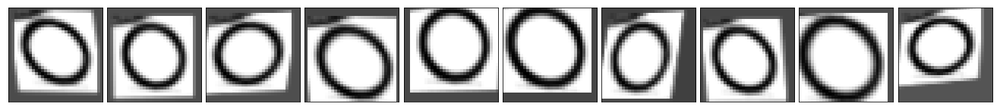

--------------------------------------------------------------------------------------

Class 16: Vehicles over 3.5 metric tons prohibited          


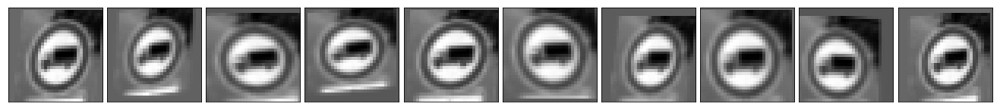

--------------------------------------------------------------------------------------

Class 17: No entry                                          


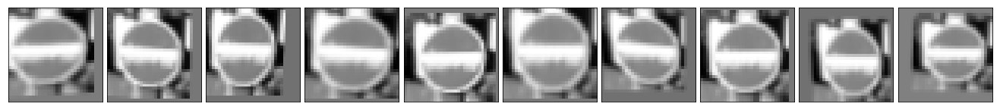

--------------------------------------------------------------------------------------

Class 18: General caution                                   


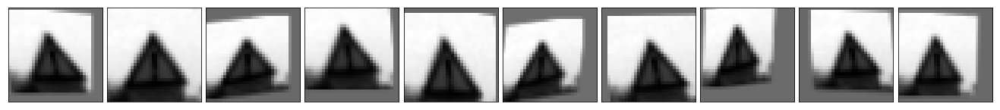

--------------------------------------------------------------------------------------

Class 19: Dangerous curve to the left                       


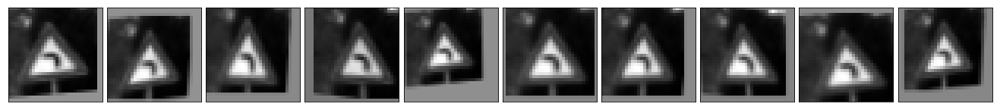

--------------------------------------------------------------------------------------

Class 20: Dangerous curve to the right                      


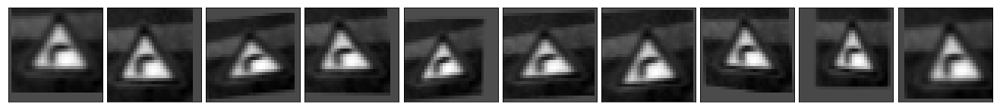

--------------------------------------------------------------------------------------

Class 21: Double curve                                      


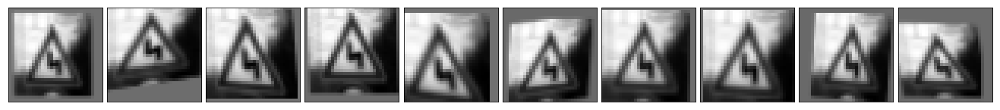

--------------------------------------------------------------------------------------

Class 22: Bumpy road                                        


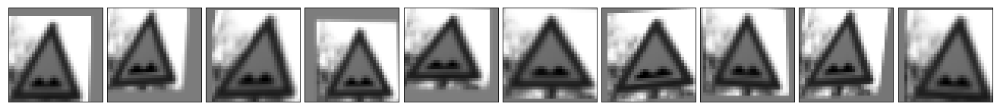

--------------------------------------------------------------------------------------

Class 23: Slippery road                                     


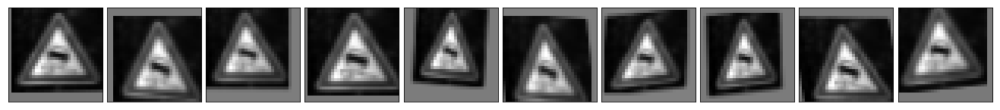

--------------------------------------------------------------------------------------

Class 24: Road narrows on the right                         


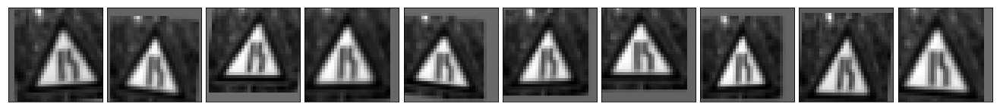

--------------------------------------------------------------------------------------

Class 25: Road work                                         


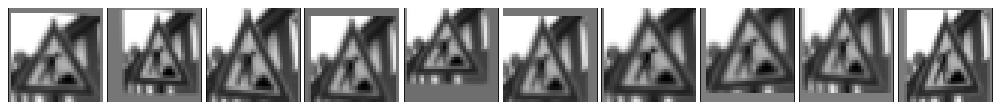

--------------------------------------------------------------------------------------

Class 26: Traffic signals                                   


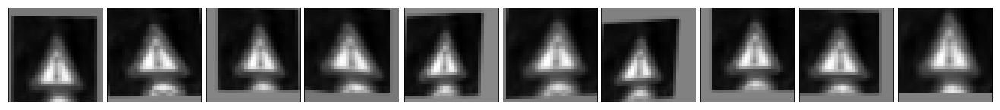

--------------------------------------------------------------------------------------

Class 27: Pedestrians                                       


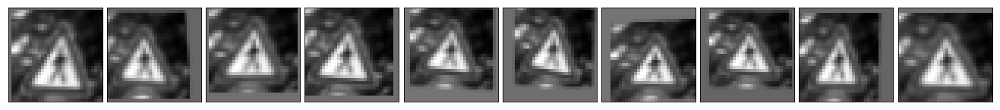

--------------------------------------------------------------------------------------

Class 28: Children crossing                                 


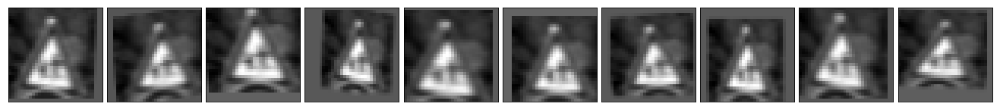

--------------------------------------------------------------------------------------

Class 29: Bicycles crossing                                 


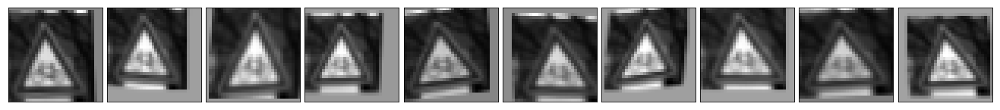

--------------------------------------------------------------------------------------

Class 30: Beware of ice/snow                                


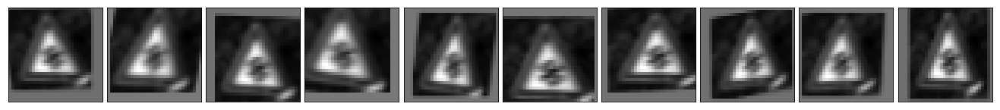

--------------------------------------------------------------------------------------

Class 31: Wild animals crossing                             


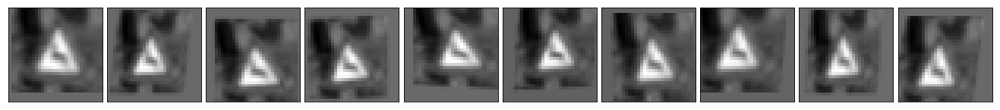

--------------------------------------------------------------------------------------

Class 32: End of all speed and passing limits               


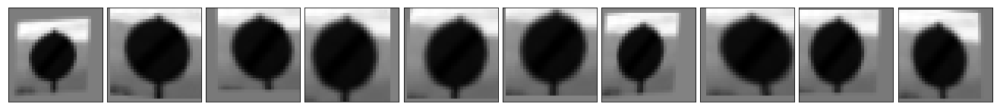

--------------------------------------------------------------------------------------

Class 33: Turn right ahead                                  


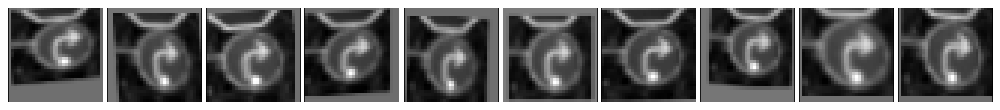

--------------------------------------------------------------------------------------

Class 34: Turn left ahead                                   


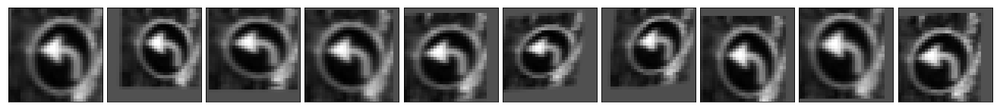

--------------------------------------------------------------------------------------

Class 35: Ahead only                                        


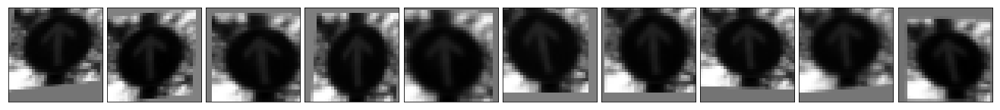

--------------------------------------------------------------------------------------

Class 36: Go straight or right                              


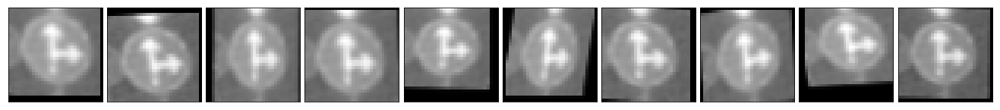

--------------------------------------------------------------------------------------

Class 37: Go straight or left                               


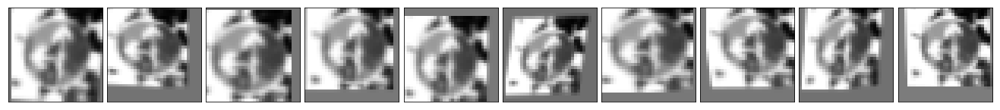

--------------------------------------------------------------------------------------

Class 38: Keep right                                        


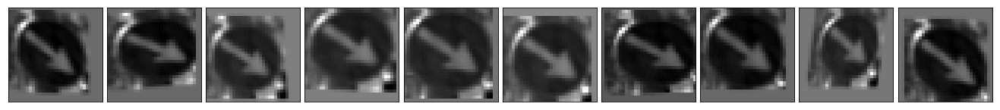

--------------------------------------------------------------------------------------

Class 39: Keep left                                         


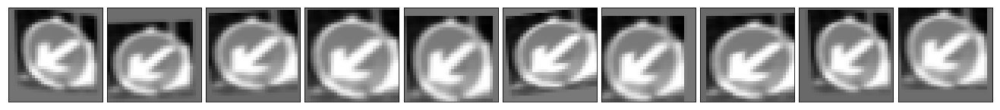

--------------------------------------------------------------------------------------

Class 40: Roundabout mandatory                              


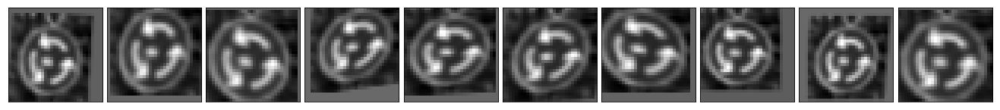

--------------------------------------------------------------------------------------

Class 41: End of no passing                                 


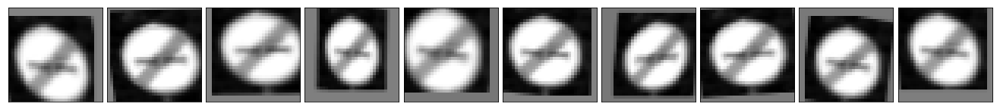

--------------------------------------------------------------------------------------

Class 42: End of no passing by vehicles over 3.5 metric tons


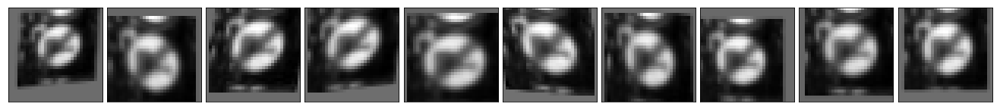

--------------------------------------------------------------------------------------



In [19]:
# Test augment one image for each class
sign_classes, class_indices, class_counts = np.unique(y_train, return_index = True, return_counts = True)

for c, c_index, c_count in zip(sign_classes, class_indices, class_counts):
    print("Class %i: %-*s" % (c, col_width, signnames[c]))
    fig = plt.figure(figsize = (18, 3))
    fig.subplots_adjust(left = 0, right = 1, bottom = 0, top = 1, hspace = 0.05, wspace = 0.05)
    random_index = random.sample(range(c_index, c_index + c_count), 1)
    random_image = X_train_normalized[random_index[0]]
    
    for i in range(10):
        axis = fig.add_subplot(1, 10, i + 1, xticks=[], yticks=[])
        axis.imshow(augment_image(random_image).squeeze(), cmap='gray')
    plt.show()
    print("--------------------------------------------------------------------------------------\n")

I have tried to augment the training dataset by 15 times and keep the same unbalanced distribution of dataset. It was a very difficult to decide between make the traing dataset become balanced but not much data and augment the traing dataset as much as possible. I finally choose the maximum data augmentation option after comparing two approaches.

In [20]:
def combine_data(train_images, train_labels, valid_images, valid_labels):
    # Combine the training and validation images in order to augment in total
    X_total = np.concatenate((train_images, valid_images), axis=0)
    y_total = np.concatenate((train_labels, valid_labels), axis=0)
    show_sample_images(y_total, X_total, cmap='gray')
    return X_total, y_total

def augment_train_images(images, labels):
    sign_classes, class_indices, class_counts = np.unique(labels, return_index = True, return_counts = True)
    images_aug = []
    labels_aug = []
    n_augs = []
    for c, c_index, c_count in zip(sign_classes, class_indices, class_counts):
        print("Processing Class %i: %-*s  %s samples" % (c, col_width, signnames[c], str(c_count)))
        if c_count < 1000:
            n_aug = 15 
        elif c_count < 1500:
            n_aug = 5
        else:
            n_aug = 3
        n_augs.append(n_aug)
        for i in range(c_index, c_index + c_count):
            img = images[i]
            y = labels[i]
            images_aug.append(img)
            labels_aug.append(y)
            for j in range(n_aug):
                new_img = augment_image(img)
                images_aug.append(new_img)
                labels_aug.append(y)
            if i%10 == 0:
                print('-', end='')
            if i%50 == 0:
                print('|', end='')
        
        print()
        print("After augumentation size:", (c_count + 1)*n_aug)
        print("--------------------------------------------------------------------------------------\n")
    return images_aug, labels_aug, n_augs

def augment_mass_train_images(images, labels, n_aug=15):
    sign_classes, class_indices, class_counts = np.unique(labels, return_index = True, return_counts = True)
    images_aug = []
    labels_aug = []
    n_aug = 15
    n_augs = []
    for c, c_index, c_count in zip(sign_classes, class_indices, class_counts):
        print("Processing Class %i: %-*s  %s samples" % (c, col_width, signnames[c], str(c_count)))
        n_augs.append(n_aug)
        for i in range(c_index, c_index + c_count):
            img = images[i]
            y = labels[i]
            images_aug.append(img)
            labels_aug.append(y)
            for j in range(n_aug):
                new_img = augment_image(img)
                images_aug.append(new_img)
                labels_aug.append(y)
            if i%10 == 0:
                print('-', end='')
            if i%50 == 0:
                print('|', end='')
        
        print()
        print("After augumentation size:", (c_count + 1)*n_aug)
        print("--------------------------------------------------------------------------------------\n")
    return images_aug, labels_aug, n_augs

def augment_valid_images(images, labels, n_augs):
    sign_classes, class_indices, class_counts = np.unique(labels, return_index = True, return_counts = True)
    images_aug = []
    labels_aug = []
    n_aug = 10
    for c, c_index, c_count in zip(sign_classes, class_indices, class_counts):
        print("Processing Class %i: %-*s  %s samples" % (c, col_width, signnames[c], str(c_count)))
        n_aug = n_augs[c]
        for i in range(c_index, c_index + c_count):
            img = images[i]
            y = labels[i]
            images_aug.append(img)
            labels_aug.append(y)
            for j in range(n_aug):
                new_img = augment_image(img)
                images_aug.append(new_img)
                labels_aug.append(y)
            if i%10 == 0:
                print('-', end='')
            if i%50 == 0:
                print('|', end='')
        
        print()
        print("After augumentation size:", (c_count + 1)*n_aug)
        print("--------------------------------------------------------------------------------------\n")
    
    return images_aug, labels_aug
    
    
def augment_images(train_images, train_labels, valid_images, valid_labels):
    X_train_aug, y_train_aug, n_augs = augment_train_images(train_images, train_labels)
    X_valid_aug, y_valid_aug = augment_valid_images(valid_images, valid_labels, n_augs)
    return X_train_aug, X_valid_aug, y_train_aug, y_valid_aug

#X_train_final, X_valid_final, y_train_final, y_valid_final = augment_images(X_train_normalized, y_train, X_valid_normalized, y_valid)
#X_train_final, y_train_final, n_augs = augment_train_images(X_train_normalized, y_train)
#X_train_final, y_train_final, n_augs = augment_mass_train_images(X_train_normalized, y_train, n_aug=20)
X_train_final, y_train_final, n_augs = augment_mass_train_images(X_train_normalized, y_train, n_aug=15)
X_valid_final = X_valid_normalized
y_valid_final = y_valid

Processing Class 0: Speed limit (20km/h)                                180 samples
-----|-----|-----|---
After augumentation size: 2715
--------------------------------------------------------------------------------------

Processing Class 1: Speed limit (30km/h)                                1980 samples
----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|----
After augumentation size: 29715
--------------------------------------------------------------------------------------

Processing Class 2: Speed limit (50km/h)                                2010 samples
--|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|----
After

-|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|----
After augumentation size: 20265
--------------------------------------------------------------------------------------

Processing Class 26: Traffic signals                                     540 samples
---|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-
After augumentation size: 8115
--------------------------------------------------------------------------------------

Processing Class 27: Pedestrians                                         210 samples
-|-----|-----|-----|-----|
After augumentation size: 3165
--------------------------------------------------------------------------------------

Processing Class 28: Children crossing                                   480 samples
-|-----|-----|-----|-----|-----|-----|-----|-----|-----|--
After augumentation size: 7215
-----------------------------------------

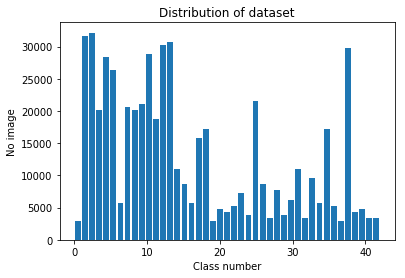

In [21]:
show_histogram(y_train_final, n_classes)

The distribution of augmented traing dataset does not change. The size of traing dataset after augmentation is 556784 images. It's bigger than the original traing dataset 15 times.

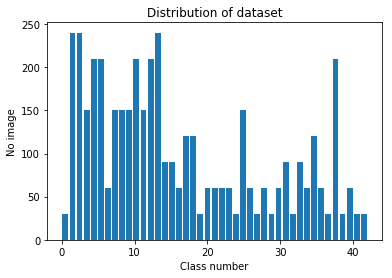

In [22]:
show_histogram(y_valid_final, n_classes)

I have tried to show some sample images from the augmented training dataset to verify it. It's great.

Class 0: Speed limit (20km/h)                                2880 samples


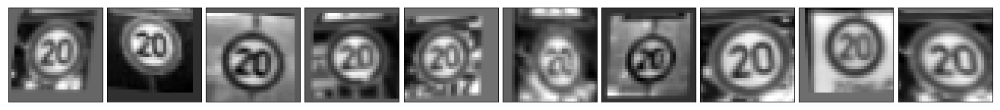

--------------------------------------------------------------------------------------

Class 1: Speed limit (30km/h)                                31680 samples


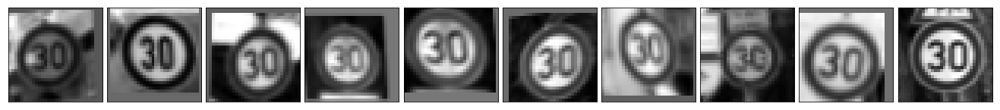

--------------------------------------------------------------------------------------

Class 2: Speed limit (50km/h)                                32160 samples


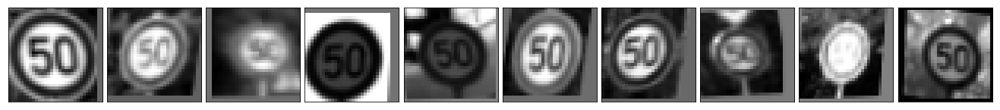

--------------------------------------------------------------------------------------

Class 3: Speed limit (60km/h)                                20160 samples


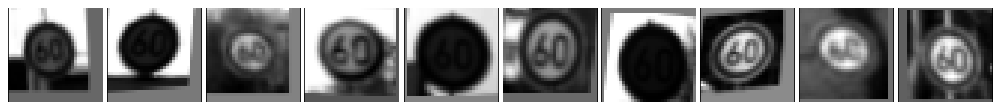

--------------------------------------------------------------------------------------

Class 4: Speed limit (70km/h)                                28320 samples


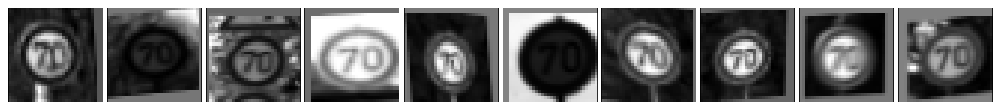

--------------------------------------------------------------------------------------

Class 5: Speed limit (80km/h)                                26400 samples


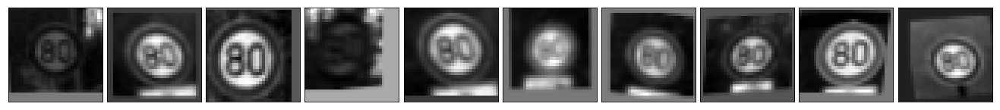

--------------------------------------------------------------------------------------

Class 6: End of speed limit (80km/h)                         5760 samples


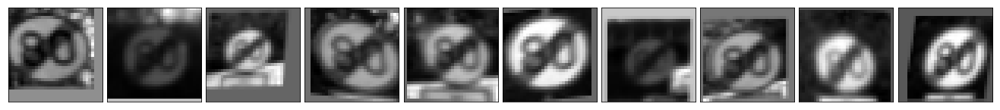

--------------------------------------------------------------------------------------

Class 7: Speed limit (100km/h)                               20640 samples


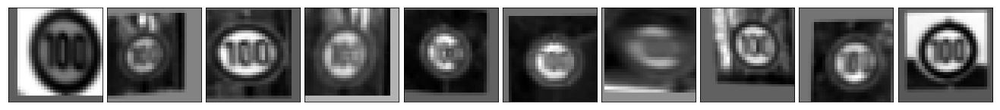

--------------------------------------------------------------------------------------

Class 8: Speed limit (120km/h)                               20160 samples


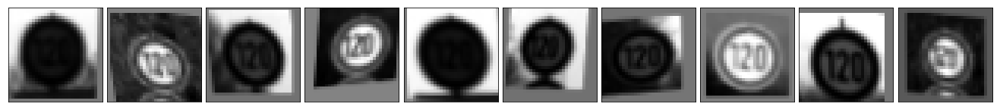

--------------------------------------------------------------------------------------

Class 9: No passing                                          21120 samples


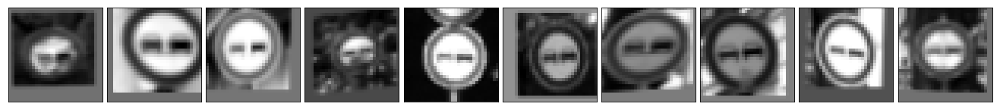

--------------------------------------------------------------------------------------

Class 10: No passing for vehicles over 3.5 metric tons        28800 samples


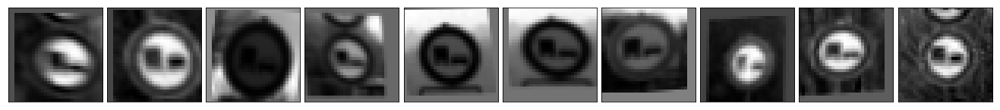

--------------------------------------------------------------------------------------

Class 11: Right-of-way at the next intersection               18720 samples


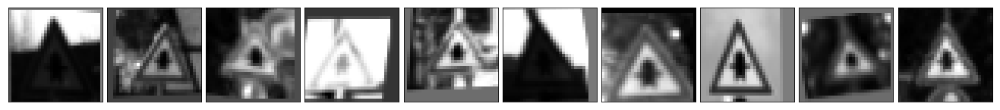

--------------------------------------------------------------------------------------

Class 12: Priority road                                       30240 samples


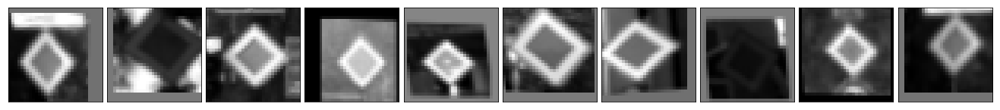

--------------------------------------------------------------------------------------

Class 13: Yield                                               30720 samples


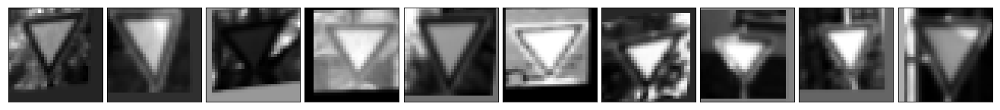

--------------------------------------------------------------------------------------

Class 14: Stop                                                11040 samples


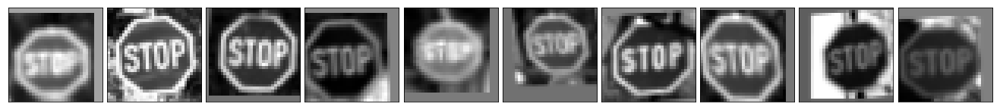

--------------------------------------------------------------------------------------

Class 15: No vehicles                                         8640 samples


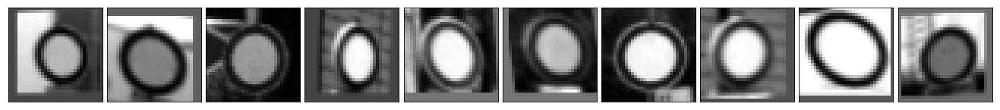

--------------------------------------------------------------------------------------

Class 16: Vehicles over 3.5 metric tons prohibited            5760 samples


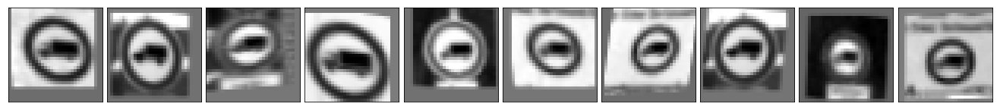

--------------------------------------------------------------------------------------

Class 17: No entry                                            15840 samples


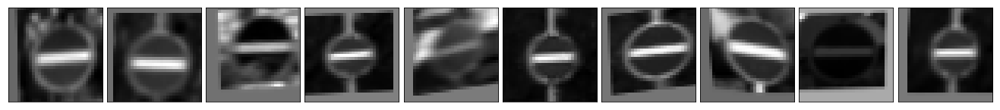

--------------------------------------------------------------------------------------

Class 18: General caution                                     17280 samples


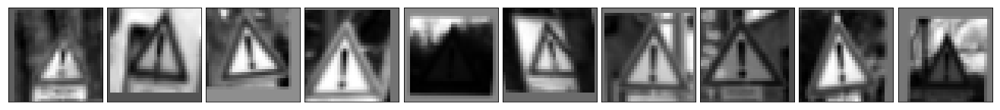

--------------------------------------------------------------------------------------

Class 19: Dangerous curve to the left                         2880 samples


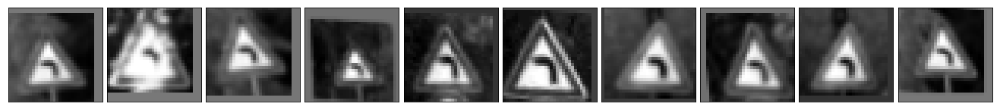

--------------------------------------------------------------------------------------

Class 20: Dangerous curve to the right                        4800 samples


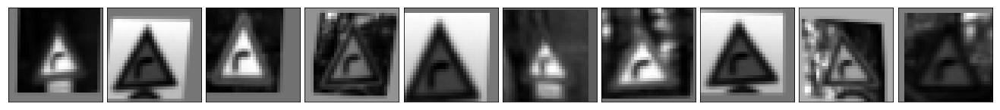

--------------------------------------------------------------------------------------

Class 21: Double curve                                        4320 samples


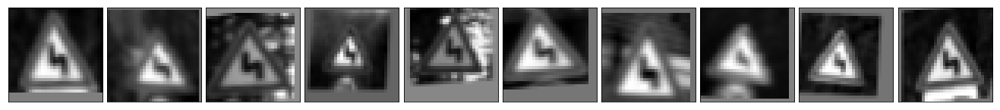

--------------------------------------------------------------------------------------

Class 22: Bumpy road                                          5280 samples


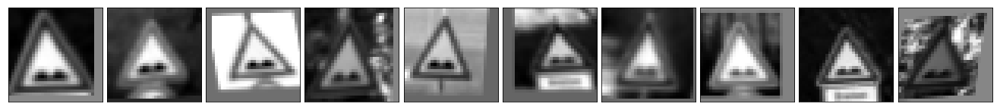

--------------------------------------------------------------------------------------

Class 23: Slippery road                                       7200 samples


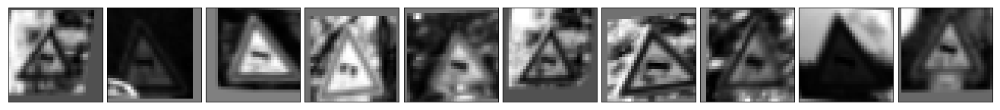

--------------------------------------------------------------------------------------

Class 24: Road narrows on the right                           3840 samples


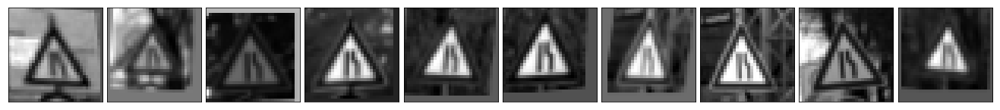

--------------------------------------------------------------------------------------

Class 25: Road work                                           21600 samples


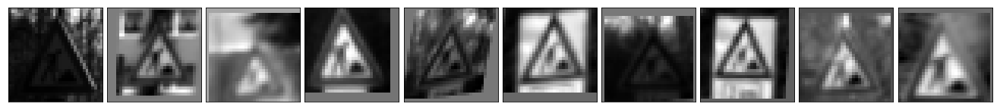

--------------------------------------------------------------------------------------

Class 26: Traffic signals                                     8640 samples


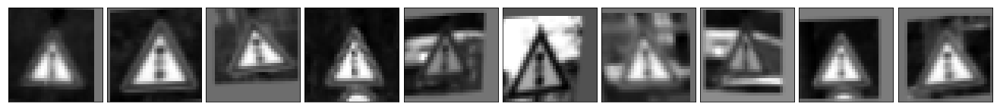

--------------------------------------------------------------------------------------

Class 27: Pedestrians                                         3360 samples


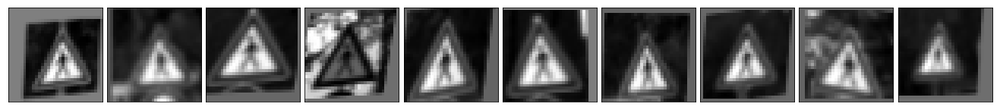

--------------------------------------------------------------------------------------

Class 28: Children crossing                                   7680 samples


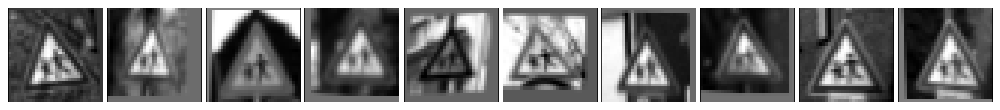

--------------------------------------------------------------------------------------

Class 29: Bicycles crossing                                   3840 samples


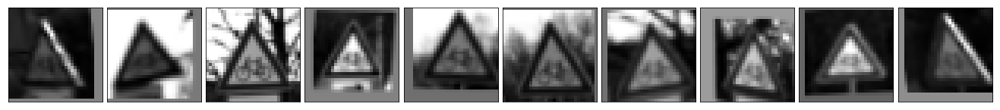

--------------------------------------------------------------------------------------

Class 30: Beware of ice/snow                                  6240 samples


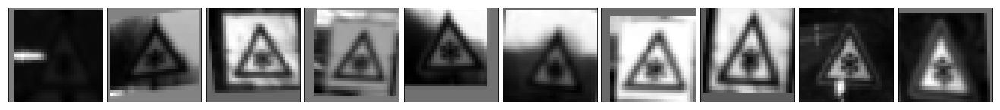

--------------------------------------------------------------------------------------

Class 31: Wild animals crossing                               11040 samples


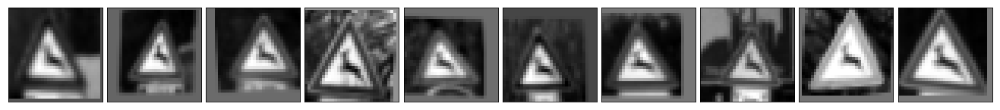

--------------------------------------------------------------------------------------

Class 32: End of all speed and passing limits                 3360 samples


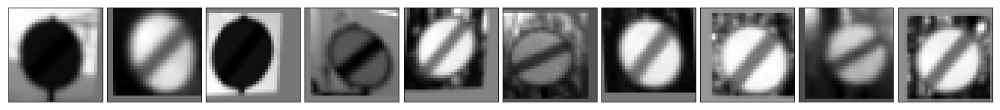

--------------------------------------------------------------------------------------

Class 33: Turn right ahead                                    9584 samples


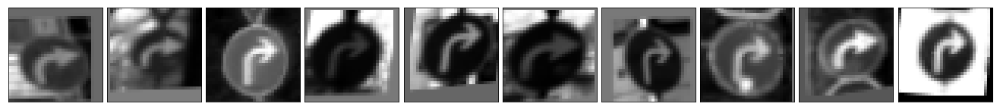

--------------------------------------------------------------------------------------

Class 34: Turn left ahead                                     5760 samples


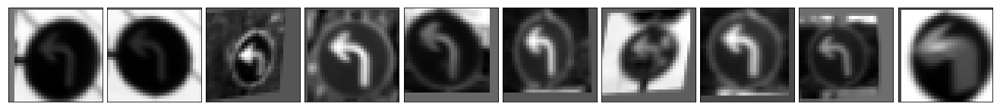

--------------------------------------------------------------------------------------

Class 35: Ahead only                                          17280 samples


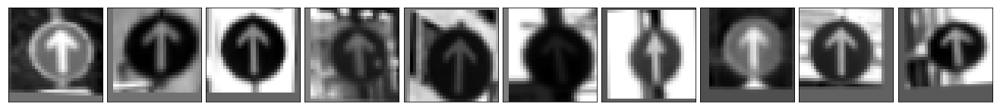

--------------------------------------------------------------------------------------

Class 36: Go straight or right                                5280 samples


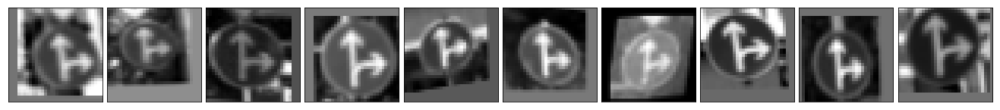

--------------------------------------------------------------------------------------

Class 37: Go straight or left                                 2880 samples


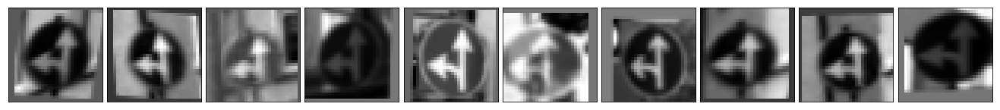

--------------------------------------------------------------------------------------

Class 38: Keep right                                          29760 samples


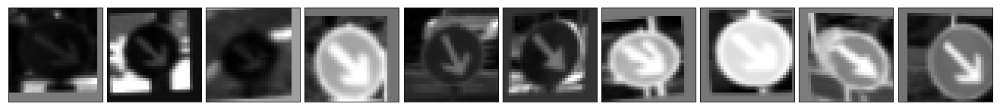

--------------------------------------------------------------------------------------

Class 39: Keep left                                           4320 samples


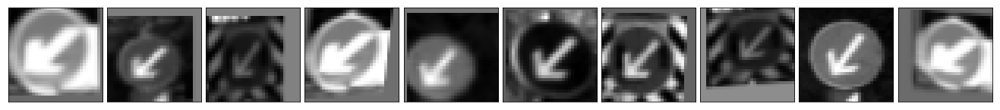

--------------------------------------------------------------------------------------

Class 40: Roundabout mandatory                                4800 samples


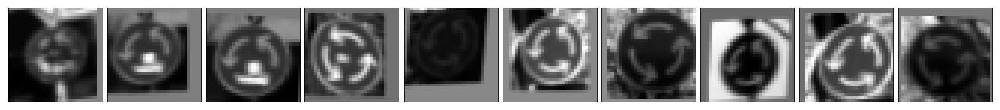

--------------------------------------------------------------------------------------

Class 41: End of no passing                                   3360 samples


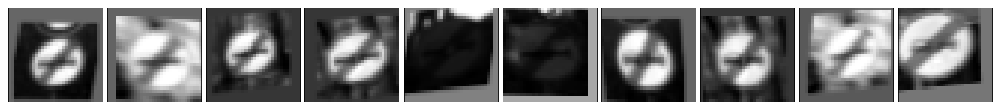

--------------------------------------------------------------------------------------

Class 42: End of no passing by vehicles over 3.5 metric tons  3360 samples


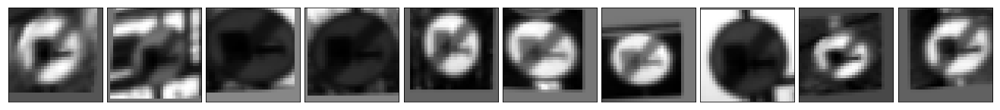

--------------------------------------------------------------------------------------



In [23]:
show_sample_images(y_train_final, X_train_final, cmap='gray')

Class 0: Speed limit (20km/h)                                30 samples


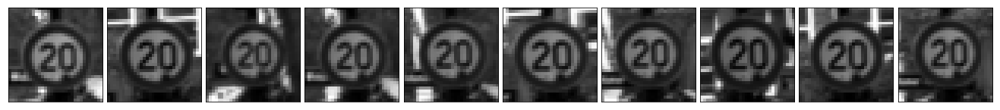

--------------------------------------------------------------------------------------

Class 1: Speed limit (30km/h)                                240 samples


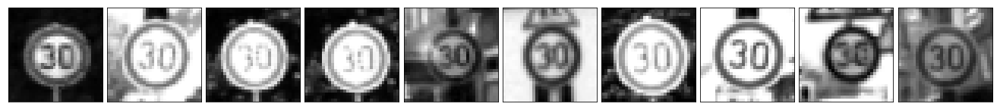

--------------------------------------------------------------------------------------

Class 2: Speed limit (50km/h)                                240 samples


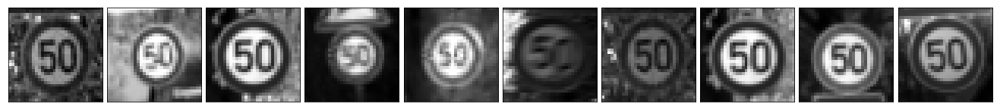

--------------------------------------------------------------------------------------

Class 3: Speed limit (60km/h)                                150 samples


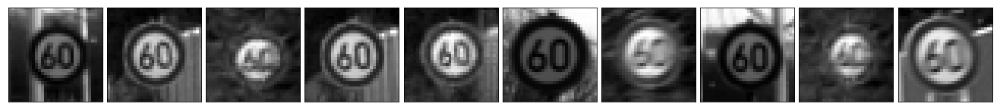

--------------------------------------------------------------------------------------

Class 4: Speed limit (70km/h)                                210 samples


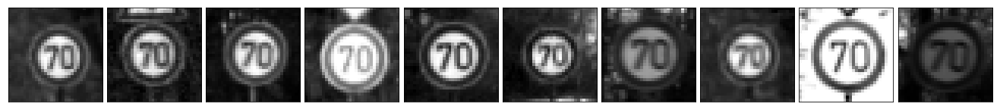

--------------------------------------------------------------------------------------

Class 5: Speed limit (80km/h)                                210 samples


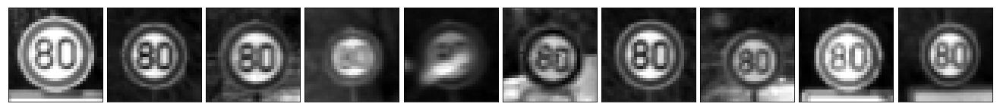

--------------------------------------------------------------------------------------

Class 6: End of speed limit (80km/h)                         60 samples


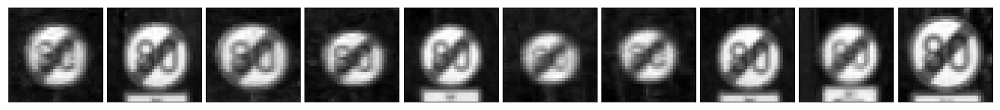

--------------------------------------------------------------------------------------

Class 7: Speed limit (100km/h)                               150 samples


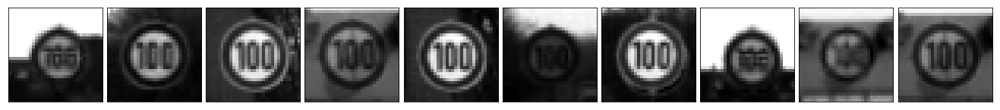

--------------------------------------------------------------------------------------

Class 8: Speed limit (120km/h)                               150 samples


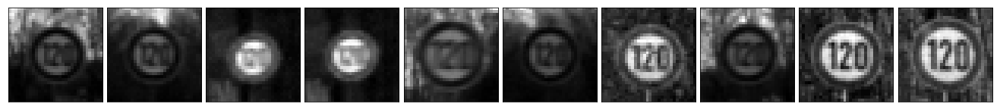

--------------------------------------------------------------------------------------

Class 9: No passing                                          150 samples


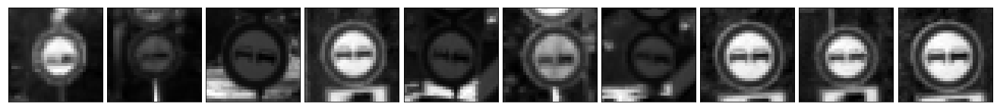

--------------------------------------------------------------------------------------

Class 10: No passing for vehicles over 3.5 metric tons        210 samples


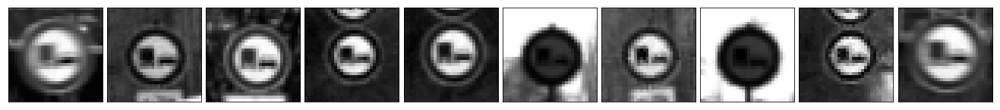

--------------------------------------------------------------------------------------

Class 11: Right-of-way at the next intersection               150 samples


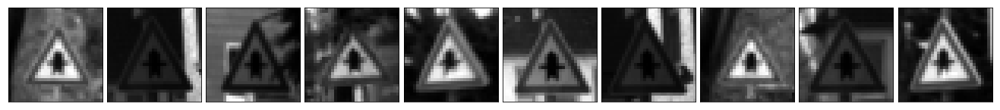

--------------------------------------------------------------------------------------

Class 12: Priority road                                       210 samples


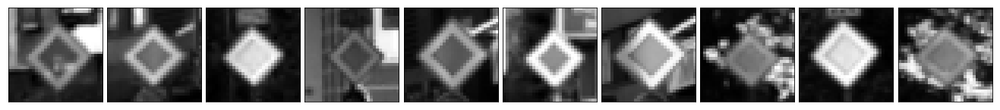

--------------------------------------------------------------------------------------

Class 13: Yield                                               240 samples


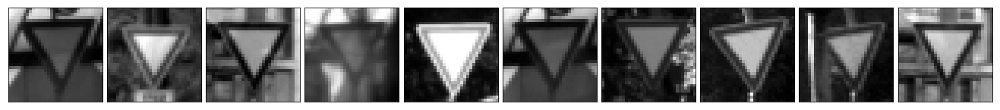

--------------------------------------------------------------------------------------

Class 14: Stop                                                90 samples


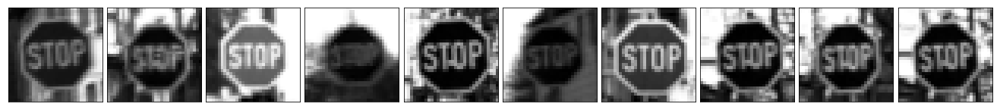

--------------------------------------------------------------------------------------

Class 15: No vehicles                                         90 samples


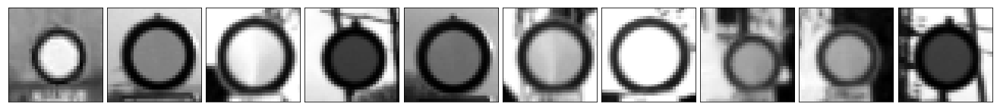

--------------------------------------------------------------------------------------

Class 16: Vehicles over 3.5 metric tons prohibited            60 samples


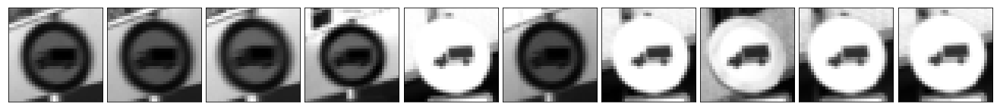

--------------------------------------------------------------------------------------

Class 17: No entry                                            120 samples


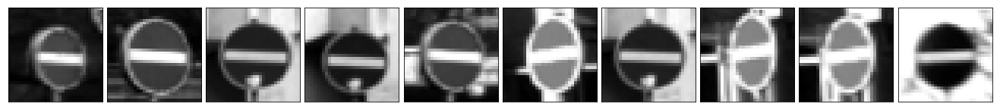

--------------------------------------------------------------------------------------

Class 18: General caution                                     120 samples


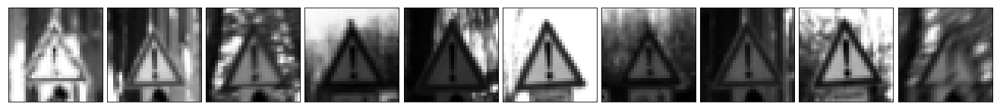

--------------------------------------------------------------------------------------

Class 19: Dangerous curve to the left                         30 samples


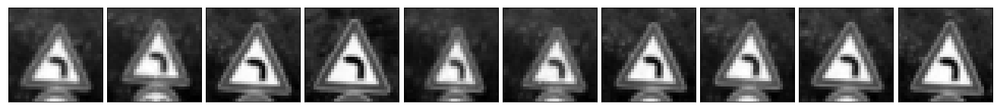

--------------------------------------------------------------------------------------

Class 20: Dangerous curve to the right                        60 samples


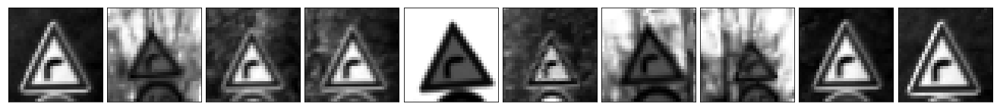

--------------------------------------------------------------------------------------

Class 21: Double curve                                        60 samples


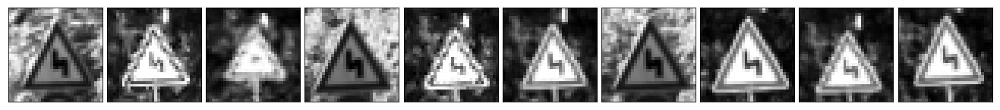

--------------------------------------------------------------------------------------

Class 22: Bumpy road                                          60 samples


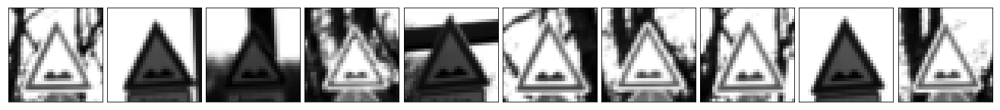

--------------------------------------------------------------------------------------

Class 23: Slippery road                                       60 samples


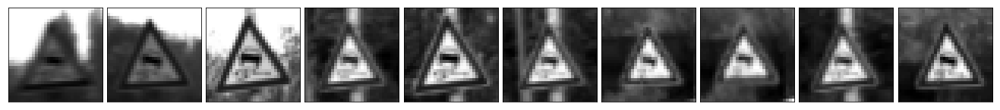

--------------------------------------------------------------------------------------

Class 24: Road narrows on the right                           30 samples


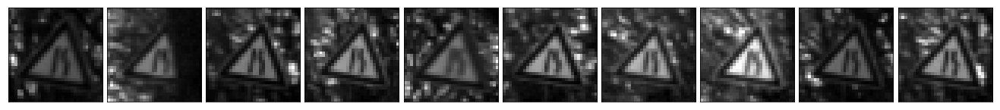

--------------------------------------------------------------------------------------

Class 25: Road work                                           150 samples


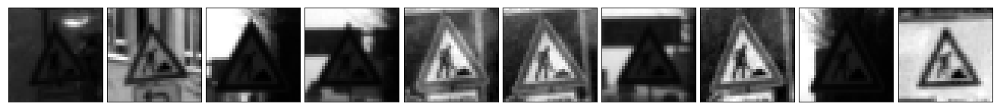

--------------------------------------------------------------------------------------

Class 26: Traffic signals                                     60 samples


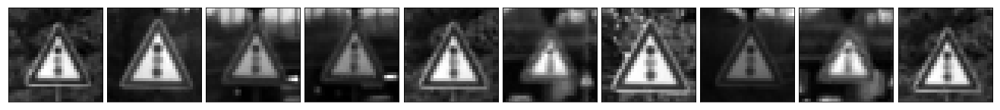

--------------------------------------------------------------------------------------

Class 27: Pedestrians                                         30 samples


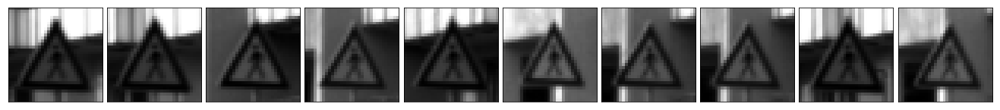

--------------------------------------------------------------------------------------

Class 28: Children crossing                                   60 samples


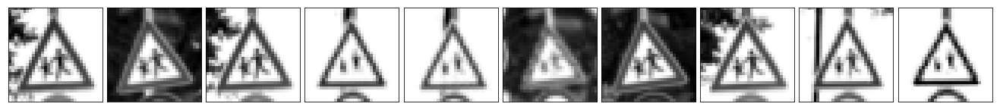

--------------------------------------------------------------------------------------

Class 29: Bicycles crossing                                   30 samples


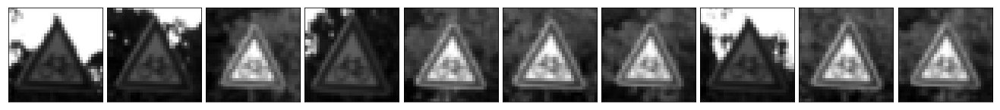

--------------------------------------------------------------------------------------

Class 30: Beware of ice/snow                                  60 samples


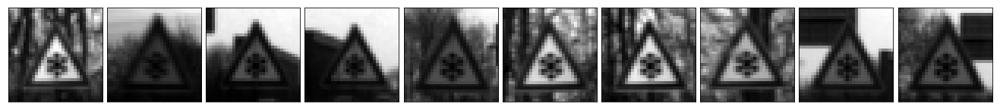

--------------------------------------------------------------------------------------

Class 31: Wild animals crossing                               90 samples


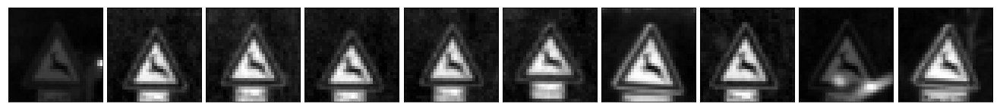

--------------------------------------------------------------------------------------

Class 32: End of all speed and passing limits                 30 samples


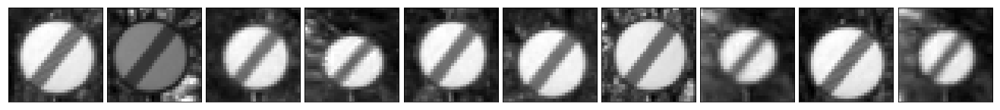

--------------------------------------------------------------------------------------

Class 33: Turn right ahead                                    90 samples


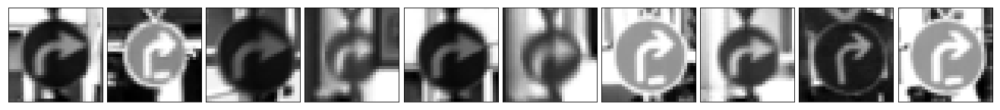

--------------------------------------------------------------------------------------

Class 34: Turn left ahead                                     60 samples


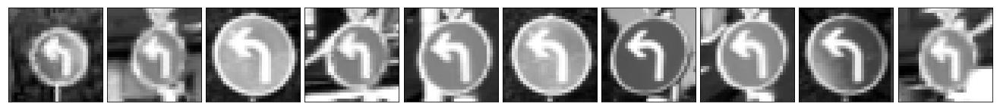

--------------------------------------------------------------------------------------

Class 35: Ahead only                                          120 samples


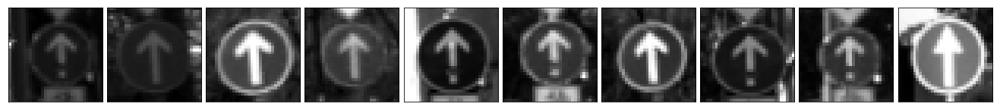

--------------------------------------------------------------------------------------

Class 36: Go straight or right                                60 samples


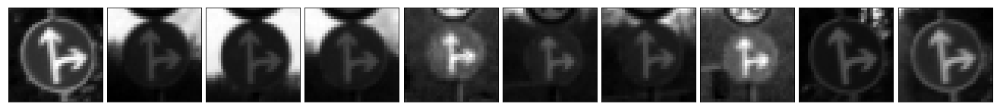

--------------------------------------------------------------------------------------

Class 37: Go straight or left                                 30 samples


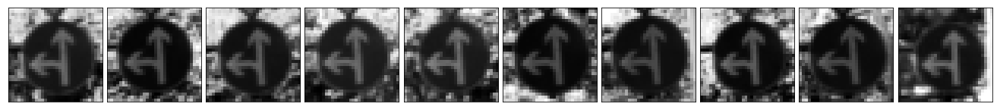

--------------------------------------------------------------------------------------

Class 38: Keep right                                          210 samples


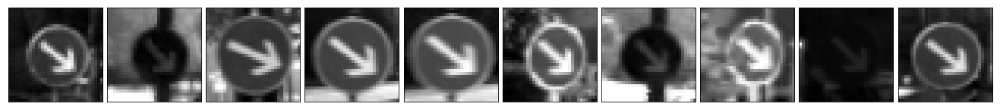

--------------------------------------------------------------------------------------

Class 39: Keep left                                           30 samples


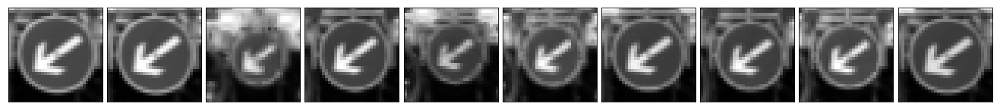

--------------------------------------------------------------------------------------

Class 40: Roundabout mandatory                                60 samples


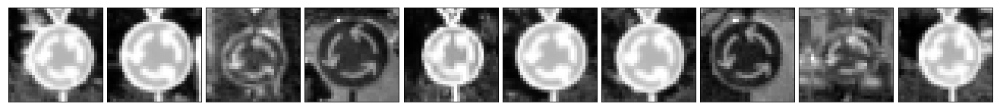

--------------------------------------------------------------------------------------

Class 41: End of no passing                                   30 samples


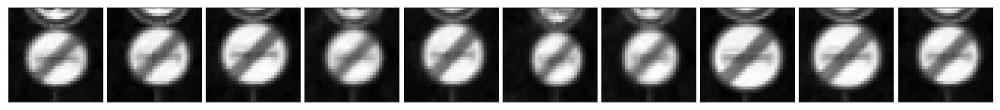

--------------------------------------------------------------------------------------

Class 42: End of no passing by vehicles over 3.5 metric tons  30 samples


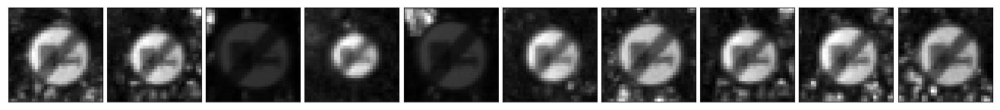

--------------------------------------------------------------------------------------



In [24]:
show_sample_images(y_valid_final, X_valid_final, cmap='gray')

### Model Architecture

I have tried to implement two model architectures: the original LeNet and the modified LeNet architecture from [Pierre Sermanet and Yann LeCun article](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). After comparing, I have choosen the modified LeNet model architecture from Pierre and Yann because it's more accurancy. Please reference to my report (HERE link to report) for more detail.


#### Lenet Pierre Yan model architecture

![LeNetYan](LeNet-Yann.png)

In [26]:
import tensorflow as tf

from tensorflow.contrib.layers import flatten

keep_prob = tf.placeholder(tf.float32)
#keep_prob_conv1  = tf.placeholder(tf.float32)
#keep_prob_conv2 = tf.placeholder(tf.float32)
# Multi-Scale Convolutional Neural Networks - Pierre Sermanet and Yann LeCun
# http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf

def LeNet_Pierre_Yann(x, mu=0, sigma=0.1):
     # Layer 1: Convolutional. Input = 32x32x1. Output = 28x28x6.
    # Need a filter height, width = 5 - strides 2 - VALID PADDING
    # VALID Padding, the output height and width are computed as:
    #out_height = ceil(float(in_height - filter_height + 1) / float(strides[1]))
    # (32-5 + 1)/1
    conv1_weights = tf.Variable(tf.truncated_normal(shape=(5,5,1,6), mean = mu, stddev = sigma))
    conv1_bias = tf.Variable(tf.zeros(6))
    conv1_strides = [1, 1, 1, 1]
    conv1_padding = 'VALID'
    conv1_layer = tf.nn.bias_add(tf.nn.conv2d(x, conv1_weights, conv1_strides, conv1_padding), conv1_bias)
    
     # Activation.
    # Choose relu
    conv1_layer = tf.nn.relu(conv1_layer)
    # Pooling. Input = 28x28x6. Output = 14x14x6.
    # SAME Padding
    # out_height = ceil(float(in_height) / float(strides[1]))
    conv1_pksize = [1,2,2, 1]
    conv1_pstrides = [1,2,2, 1]
    conv1_kpadding = 'VALID'
    conv1_layer = tf.nn.max_pool(conv1_layer, conv1_pksize, conv1_pstrides, conv1_kpadding)
    
     # Dropout
    #conv1_layer = tf.nn.dropout(conv1_layer, keep_prob_conv1)
    
     # Layer 2: Convolutional. Output = 10x10x16.
    # Input from layer 1: 14x14x6
    # (14-5+1)/1 - filter width - height = 5, strides 1
    conv2_weights = tf.Variable(tf.truncated_normal(shape=(5,5,6,16), mean = mu, stddev = sigma))
    conv2_bias = tf.Variable(tf.zeros(16))
    conv2_strides = [1, 1, 1, 1]
    conv2_padding = 'VALID'
    conv2_layer = tf.nn.bias_add(tf.nn.conv2d(conv1_layer, conv2_weights, conv2_strides, conv2_padding), conv2_bias)
    # Activation.
    # Choose RELU
    conv2_layer = tf.nn.relu(conv2_layer)
    # Pooling. Input = 10x10x16. Output = 5x5x16.
    # SAME PADDING with strides = 2
    conv2_pksize = [1, 2, 2, 1]
    conv2_pstrides = [1, 2, 2, 1]
    conv2_ppadding = 'VALID'
    conv2_layer = tf.nn.max_pool(conv2_layer, conv2_pksize, conv2_pstrides, conv2_ppadding)
     # Dropout
    #conv2_layer = tf.nn.dropout(conv2_layer, keep_prob_conv2)
    
    
    # Layer 3: Convolutional. Input: 5x5x16
    # Filter 3,3, 50
    # Output (5 - 3 + 1)/1 = 3 => 3x3x50
    conv3_weights = tf.Variable(tf.truncated_normal(shape=(3,3,16,50), mean = mu, stddev = sigma))
    conv3_bias = tf.Variable(tf.zeros(50))
    conv3_strides = [1,1,1,1]
    conv3_padding = 'VALID'
    conv3_layer = tf.nn.bias_add(tf.nn.conv2d(conv2_layer, conv3_weights, conv3_strides, conv3_padding), conv3_bias)
    
    # RELU activation
    conv3_layer = tf.nn.relu(conv3_layer)
    
    
    # Flatten layer 1 - Input = 14x14x6. Output = 1176.
    #fc_layer1_flat = flatten(conv1_layer)
    
    # Flatten layer 2 - Input = 5x5x16. Output = 400.
    fc_layer2_flat = flatten(conv2_layer)
    
    # Flatten layer 3 - Input = 3x3x50. Output = 450
    fc_layer3_flat = flatten(conv3_layer)
    
    # Concat layer 2 flat and layer 3 flat. Input = 400 + 450. Output = 850
    fc = tf.concat([fc_layer2_flat, fc_layer3_flat], 1)
    
     # Dropout
    fc_dropout = tf.nn.dropout(fc, keep_prob)
    
    # TODO: Layer 4: Fully Connected. Input = 850. Output = 43.
    fc1_w = tf.Variable(tf.truncated_normal(shape=(850, 43), mean = mu, stddev = sigma))
    fc1_b = tf.Variable(tf.zeros(43))    
    logits = tf.add(tf.matmul(fc_dropout, fc1_w), fc1_b)
    
    return logits
    
    
    

#### Lenet Pierre model architecture

The LeNet model architecture is implemented following the Udacity course material.

In [27]:
from tensorflow.contrib.layers import flatten

keep_prob = tf.placeholder(tf.float32)

def LeNet(x, mu=0, sigma=0.1):    
  
    
    # Layer 1: Convolutional. Input = 32x32x1. Output = 28x28x6.
    # Need a filter height, width = 5 - strides 2 - VALID PADDING
    # VALID Padding, the output height and width are computed as:
    #out_height = ceil(float(in_height - filter_height + 1) / float(strides[1]))
    # (32-5 + 1)/1
    conv1_weights = tf.Variable(tf.truncated_normal(shape=(5,5,1,6), mean = mu, stddev = sigma))
    conv1_bias = tf.Variable(tf.zeros(6))
    conv1_strides = [1, 1, 1, 1]
    conv1_padding = 'VALID'
    conv1_layer = tf.nn.bias_add(tf.nn.conv2d(x, conv1_weights, conv1_strides, conv1_padding), conv1_bias)
    # Activation.
    # Choose relu
    conv1_layer = tf.nn.relu(conv1_layer)
    # Pooling. Input = 28x28x6. Output = 14x14x6.
    # SAME Padding
    # out_height = ceil(float(in_height) / float(strides[1]))
    conv1_pksize = [1,2,2, 1]
    conv1_pstrides = [1,2,2, 1]
    conv1_kpadding = 'SAME'
    conv1_layer = tf.nn.max_pool(conv1_layer, conv1_pksize, conv1_pstrides, conv1_kpadding)
    
    
    # Layer 2: Convolutional. Output = 10x10x16.
    # Input from layer 1: 14x14x6
    # (14-5+1)/1 - filter width - height = 5, strides 1
    conv2_weights = tf.Variable(tf.truncated_normal(shape=(5,5,6,16), mean = mu, stddev = sigma))
    conv2_bias = tf.Variable(tf.zeros(16))
    conv2_strides = [1, 1, 1, 1]
    conv2_padding = 'VALID'
    conv2_layer = tf.nn.bias_add(tf.nn.conv2d(conv1_layer, conv2_weights, conv2_strides, conv2_padding), conv2_bias)
    # Activation.
    # Choose RELU
    conv2_layer = tf.nn.relu(conv2_layer)
    # Pooling. Input = 10x10x16. Output = 5x5x16.
    # SAME PADDING with strides = 2
    conv2_pksize = [1, 2, 2, 1]
    conv2_pstrides = [1, 2, 2, 1]
    conv2_ppadding = 'SAME'
    conv2_layer = tf.nn.max_pool(conv2_layer, conv2_pksize, conv2_pstrides, conv2_ppadding)

    # Flatten. Input = 5x5x16. Output = 400.
    fc = flatten(conv2_layer)
    
    # Layer 3: Fully Connected. Input = 400. Output = 120.
    fc1_weights = tf.Variable(tf.truncated_normal(shape=(400,120), mean=mu, stddev = sigma))
    fc1_bias = tf.Variable(tf.zeros(120))
    fc1_layer = tf.matmul(fc, fc1_weights) + fc1_bias
    # Activation.
    fc1_layer = tf.nn.relu(fc1_layer)
    
    # Dropout
    fc1_layer = tf.nn.dropout(fc1_layer, keep_prob)
    
    # Layer 4: Fully Connected. Input = 120. Output = 84.
    fc2_w = tf.Variable(tf.truncated_normal(shape=(120,84), mean=mu, stddev = sigma))
    fc2_b = tf.Variable(tf.zeros(84))
    fc2_layer = tf.matmul(fc1_layer, fc2_w) + fc2_b
    
    # Activation.
    fc2_layer = tf.nn.relu(fc2_layer)
    
    fc2_layer = tf.nn.dropout(fc2_layer, keep_prob)
       
    # Layer 5: Fully Connected. Input = 84. Output = 43.
    fc3_w = tf.Variable(tf.truncated_normal(shape=(84,43), mean=mu, stddev = sigma))
    fc3_b = tf.Variable(tf.zeros(43))
    logits = tf.matmul(fc2_layer, fc3_w) + fc3_b
    return logits

### Train, Validate and Test the Model

A validation set can be used to assess how well the model is performing. A low accuracy on the training and validation
sets imply underfitting. A high accuracy on the training set but low accuracy on the validation set implies overfitting.

In [28]:
### Train your model here.
### Calculate and report the accuracy on the training and validation set.
### Once a final model architecture is selected, 
### the accuracy on the test set should be calculated and reported as well.
### Feel free to use as many code cells as needed.

In [29]:
x = tf.placeholder(tf.float32, (None, 32, 32, 1))
y = tf.placeholder(tf.int32, (None))
one_hot_y = tf.one_hot(y, 43)
EPOCHS = 50
BATCH_SIZE = 256


learning_rate  = 0.001
#learning_rate = 0.0001
#learning_rate = 0.0009

#logits = LeNet(x)
logits = LeNet_Pierre_Yann(x)
cross_entropy = tf.nn.softmax_cross_entropy_with_logits(labels=one_hot_y, logits=logits)
loss_operation = tf.reduce_mean(cross_entropy)
optimizer = tf.train.AdamOptimizer(learning_rate = learning_rate)
training_operation = optimizer.minimize(loss_operation)

In [30]:
correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(one_hot_y, 1))
accuracy_operation = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
saver = tf.train.Saver()

def evaluate(X_data, y_data):
    num_examples = len(X_data)
    total_accuracy = 0
    sess = tf.get_default_session()
    for offset in range(0, num_examples, BATCH_SIZE):
        batch_x, batch_y = X_data[offset:offset+BATCH_SIZE], y_data[offset:offset+BATCH_SIZE]
        accuracy = sess.run(accuracy_operation, feed_dict={x: batch_x, y: batch_y, keep_prob: 1.0 })
        total_accuracy += (accuracy * len(batch_x))
    return total_accuracy / num_examples

In [31]:
from timeit import default_timer as timer

# Shuffle data
from sklearn.utils import shuffle

X_train_final, y_train_final = shuffle(X_train_final, y_train_final)

validation_accuracies = []
start_time = timer()
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    num_examples = len(X_train_final)
    
    
    print("Training numer of images:", num_examples)
    print("Validation number of images:", len(X_valid_final) )
    print("Augment data strategy: Maximum augment training data (15)")
    print("learning rate = ", learning_rate)
    print("EPOCHS = ", EPOCHS)
    print("BATCH_SIZE = ", BATCH_SIZE)
    print("Drop out = 0.5")
    print()
    for i in range(EPOCHS):
        start_epoch_time = timer()
        X_train_final, y_train_final = shuffle(X_train_final, y_train_final)
        for offset in range(0, num_examples, BATCH_SIZE):
            end = offset + BATCH_SIZE
            batch_x, batch_y = X_train_final[offset:end], y_train_final[offset:end]
            sess.run(training_operation, feed_dict={x: batch_x, y: batch_y, keep_prob: 0.5})
            if (offset % 200 == 0):
                print('-', end='' )
            if (offset % 900 == 0):
                print('|', end='' )
                
            
        
        end_epoch_time = timer()
        duration_epoch = (end_epoch_time - start_epoch_time)/60
        #training_accuracy = evaluate(X_train_final, y_train_final)
        print()
        print("EPOCH {} ...".format(i+1))
        print("Training time: %4.2f mins"  %duration_epoch)
        validation_accuracy = evaluate(X_valid_final, y_valid_final)
        validation_accuracies.append(validation_accuracy)
        end_valid_epoch_time = timer()
        duration_valid_epoch = (end_valid_epoch_time - start_epoch_time) / 60
        print("Included validation time: %4.2f mins"  %duration_valid_epoch)
        #print("Tranning Accuracy = {:.3f}".format(training_accuracy))
        print("Validation Accuracy = {:.3f}".format(validation_accuracy))
        print()
        
    end_time = timer()
    duration = (end_time - start_time)/60
    print("Duration time: %4.2f mins" %duration)
    #saver.save(sess, './lenet')
    saver.save(sess, './LeNetYann-10')
    print("Model saved")

Training numer of images: 556784
Validation number of images: 4410
Augment data strategy: Maximum augment training data (15)
learning rate =  0.001
EPOCHS =  50
BATCH_SIZE =  256
Drop out = 0.5

-|---------|---------|---------|---------|---------|---------|---------|---------|---------|-----
EPOCH 1 ...
Training time: 2.78 mins
Included validation time: 2.79 mins
Validation Accuracy = 0.923

-|---------|---------|---------|---------|---------|---------|---------|---------|---------|-----
EPOCH 2 ...
Training time: 2.76 mins
Included validation time: 2.77 mins
Validation Accuracy = 0.946

-|---------|---------|---------|---------|---------|---------|---------|---------|---------|-----
EPOCH 3 ...
Training time: 2.76 mins
Included validation time: 2.77 mins
Validation Accuracy = 0.951

-|---------|---------|---------|---------|---------|---------|---------|---------|---------|-----
EPOCH 4 ...
Training time: 2.76 mins
Included validation time: 2.77 mins
Validation Accuracy = 0.968

-|---

-|---------|---------|---------|---------|---------|---------|---------|---------|---------|-----
EPOCH 41 ...
Training time: 2.76 mins
Included validation time: 2.77 mins
Validation Accuracy = 0.979

-|---------|---------|---------|---------|---------|---------|---------|---------|---------|-----
EPOCH 42 ...
Training time: 2.76 mins
Included validation time: 2.77 mins
Validation Accuracy = 0.970

-|---------|---------|---------|---------|---------|---------|---------|---------|---------|-----
EPOCH 43 ...
Training time: 2.76 mins
Included validation time: 2.76 mins
Validation Accuracy = 0.979

-|---------|---------|---------|---------|---------|---------|---------|---------|---------|-----
EPOCH 44 ...
Training time: 2.76 mins
Included validation time: 2.77 mins
Validation Accuracy = 0.974

-|---------|---------|---------|---------|---------|---------|---------|---------|---------|-----
EPOCH 45 ...
Training time: 2.76 mins
Included validation time: 2.76 mins
Validation Accuracy = 0.

I have tried to train my model with different model architectures, data augmentation approaches and hyperparameters. Finally, I have choosen the most validation accuracy model: LeNet Yann Piere, 15 times data augmentation approach and the following hyperparameters:
Learning rate = 0.001
EPOCHS = 50
BATCH SIZE = 256
Drop out with keep_prop is 0.5

The validation accuracy is 97.8%

In [32]:
X_test_gray = grayscale_images(X_test)
X_test_normalized = normalized_images(X_test_gray)

In [33]:
# Evaluate the test dataset

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    saver2 = tf.train.import_meta_graph('./LeNetYann-10.meta')
    saver2.restore(sess, "./LeNetYann-10")
    test_accuracy = evaluate(X_test_normalized, y_test)
    print("Test Set Accuracy = {:.3f}".format(test_accuracy))

INFO:tensorflow:Restoring parameters from ./LeNetYann-10
Test Set Accuracy = 0.967


Wow. Finally, I got the test set accuracy is 96.7%.

---

## Step 3: Test a Model on New Images

To give yourself more insight into how your model is working, download at least five pictures of German traffic signs from the web and use your model to predict the traffic sign type.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Load and Output the Images

Image shape: (10, 32, 32, 3)


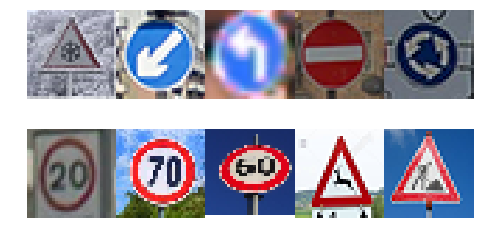

In [63]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.

import os
import matplotlib.image as mpimg

web_images = []

fig, axs = plt.subplots(2,5, figsize=(8, 4))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
for i, img in enumerate(os.listdir('./web-images/')):
    image = cv2.imread('./web-images/' + img)
    axs[i].axis('off')
    axs[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    web_images.append(image)

web_images = np.asarray(web_images)
print('Image shape:', web_images.shape)

### Predict the Sign Type for Each Image

In [65]:
### Run the predictions here and use the model to output the prediction for each image.
### Make sure to pre-process the images with the same pre-processing pipeline used earlier.
### Feel free to use as many code cells as needed.

web_images_gray = grayscale_images(web_images)
web_images_normalized = normalized_images(web_images_gray)

web_labels = [30, 39, 34, 17, 40, 0, 4, 3, 31, 25]
#web_labels = [30, 39, 34, 17, 40, 0, 4, 3]

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    saver3 = tf.train.import_meta_graph('./LeNetYann-10.meta')
    saver3.restore(sess, "./LeNetYann-10")
    my_accuracy = evaluate(web_images_normalized, web_labels)
    print("Web Images Set Accuracy = {:.3f}".format(my_accuracy))

INFO:tensorflow:Restoring parameters from ./LeNetYann-10
Web Images Set Accuracy = 1.000


It's amazing. The accuracy of web images validation is 100%. It works well with the real images from German that I found from website. And I known that it cannot work well with the Canada traffic signs system because there are some Canada traffic signs don't have in the training dataset.

### Analyze Performance

In [36]:
### Calculate the accuracy for these 5 new images. 
### For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate on these new images.

### Output Top 5 Softmax Probabilities For Each Image Found on the Web

For each of the new images, print out the model's softmax probabilities to show the **certainty** of the model's predictions (limit the output to the top 5 probabilities for each image). [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. 

The example below demonstrates how tf.nn.top_k can be used to find the top k predictions for each image.

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example. The values in the array represent predictions. The array contains softmax probabilities for five candidate images with six possible classes. `tk.nn.top_k` is used to choose the three classes with the highest probability:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

INFO:tensorflow:Restoring parameters from ./LeNetYann-10


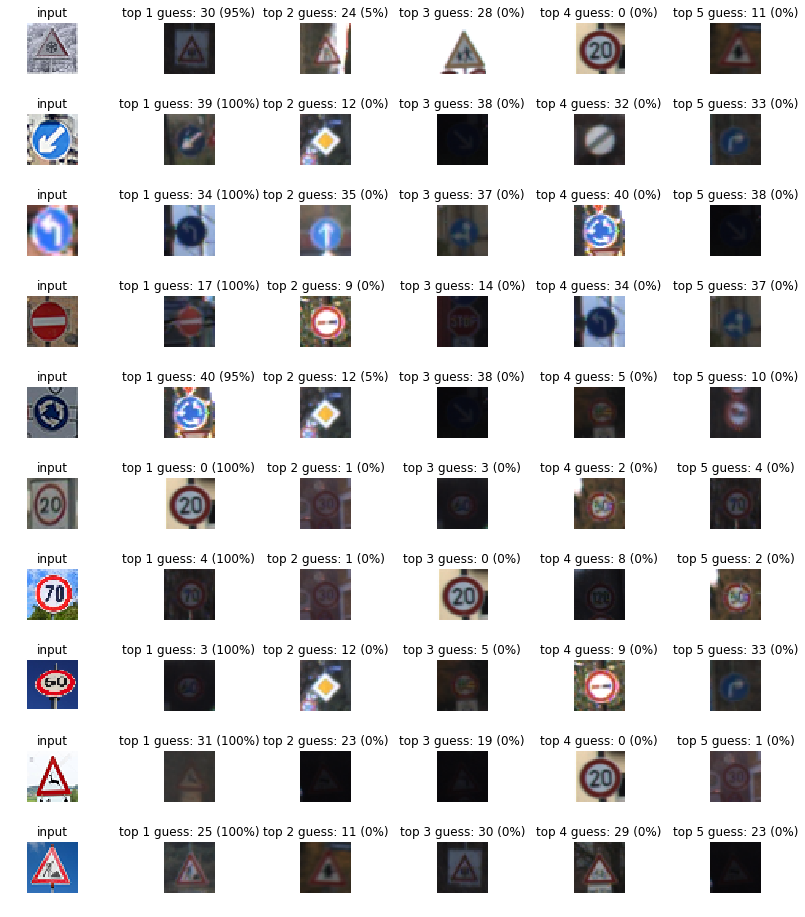

In [66]:
### Print out the top five softmax probabilities for the predictions on the German traffic sign images found on the web. 
### Feel free to use as many code cells as needed.
top = 5
softmax_logits = tf.nn.softmax(logits)
top_k = tf.nn.top_k(softmax_logits, k=top)

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    saver = tf.train.import_meta_graph('./LeNetYann-10.meta')
    saver.restore(sess, "./LeNetYann-10")
    my_softmax_logits = sess.run(softmax_logits, feed_dict={x: web_images_normalized, keep_prob: 1.0})
    my_top_k = sess.run(top_k, feed_dict={x: web_images_normalized, keep_prob: 1.0})

    
    fig, axs = plt.subplots(len(web_images),top + 1, figsize=(14, 16))
    fig.subplots_adjust(hspace = .8, wspace=.4)
    axs = axs.ravel()

    for i, image in enumerate(web_images):
        axs[6*i].axis('off')
        axs[6*i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axs[6*i].set_title('input')
        for j in range (top):
            guess = my_top_k[1][i][j]
            index = np.argwhere(y_train == guess)[0]
            axs[6*i+j + 1].axis('off')
            axs[6*i+j + 1].imshow(X_train[index].squeeze(), cmap='gray')
            axs[6*i+j + 1].set_title('top {} guess: {} ({:.0f}%)'.format(j + 1, guess, 100*my_top_k[0][i][j]))
        

It just a little bit confusion on image 1 (Beware of ice/snow traffic sign) with 95% on predict on the correct output. It has a little confused with 24 - Road narrows on the right (5% prediction). I think the reason is the brightness and there are some similar between 2 signs on the rectangle shape.

### Project Writeup

Once you have completed the code implementation, document your results in a project writeup using this [template](https://github.com/udacity/CarND-Traffic-Sign-Classifier-Project/blob/master/writeup_template.md) as a guide. The writeup can be in a markdown or pdf file. 

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

---

## Step 4 (Optional): Visualize the Neural Network's State with Test Images

 This Section is not required to complete but acts as an additional excersise for understaning the output of a neural network's weights. While neural networks can be a great learning device they are often referred to as a black box. We can understand what the weights of a neural network look like better by plotting their feature maps. After successfully training your neural network you can see what it's feature maps look like by plotting the output of the network's weight layers in response to a test stimuli image. From these plotted feature maps, it's possible to see what characteristics of an image the network finds interesting. For a sign, maybe the inner network feature maps react with high activation to the sign's boundary outline or to the contrast in the sign's painted symbol.

 Provided for you below is the function code that allows you to get the visualization output of any tensorflow weight layer you want. The inputs to the function should be a stimuli image, one used during training or a new one you provided, and then the tensorflow variable name that represents the layer's state during the training process, for instance if you wanted to see what the [LeNet lab's](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) feature maps looked like for it's second convolutional layer you could enter conv2 as the tf_activation variable.

For an example of what feature map outputs look like, check out NVIDIA's results in their paper [End-to-End Deep Learning for Self-Driving Cars](https://devblogs.nvidia.com/parallelforall/deep-learning-self-driving-cars/) in the section Visualization of internal CNN State. NVIDIA was able to show that their network's inner weights had high activations to road boundary lines by comparing feature maps from an image with a clear path to one without. Try experimenting with a similar test to show that your trained network's weights are looking for interesting features, whether it's looking at differences in feature maps from images with or without a sign, or even what feature maps look like in a trained network vs a completely untrained one on the same sign image.

<figure>
 <img src="visualize_cnn.png" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your output should look something like this (above)</p> 
 </figcaption>
</figure>
 <p></p> 


In [38]:
### Visualize your network's feature maps here.
### Feel free to use as many code cells as needed.

# image_input: the test image being fed into the network to produce the feature maps
# tf_activation: should be a tf variable name used during your training procedure that represents the calculated state of a specific weight layer
# activation_min/max: can be used to view the activation contrast in more detail, by default matplot sets min and max to the actual min and max values of the output
# plt_num: used to plot out multiple different weight feature map sets on the same block, just extend the plt number for each new feature map entry

def outputFeatureMap(image_input, tf_activation, activation_min=-1, activation_max=-1 ,plt_num=1):
    # Here make sure to preprocess your image_input in a way your network expects
    # with size, normalization, ect if needed
    # image_input =
    # Note: x should be the same name as your network's tensorflow data placeholder variable
    # If you get an error tf_activation is not defined it may be having trouble accessing the variable from inside a function
    activation = tf_activation.eval(session=sess,feed_dict={x : image_input})
    featuremaps = activation.shape[3]
    plt.figure(plt_num, figsize=(15,15))
    for featuremap in range(featuremaps):
        plt.subplot(6,8, featuremap+1) # sets the number of feature maps to show on each row and column
        plt.title('FeatureMap ' + str(featuremap)) # displays the feature map number
        if activation_min != -1 & activation_max != -1:
            plt.imshow(activation[0,:,:, featuremap], interpolation="nearest", vmin =activation_min, vmax=activation_max, cmap="gray")
        elif activation_max != -1:
            plt.imshow(activation[0,:,:, featuremap], interpolation="nearest", vmax=activation_max, cmap="gray")
        elif activation_min !=-1:
            plt.imshow(activation[0,:,:, featuremap], interpolation="nearest", vmin=activation_min, cmap="gray")
        else:
            plt.imshow(activation[0,:,:, featuremap], interpolation="nearest", cmap="gray")